<a href="https://colab.research.google.com/github/semaHbo/ev-enerji-tahmini/blob/main/EDA_Enerji_Tuketimi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

# Veri setini okuma
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00374/energydata_complete.csv"
df = pd.read_csv(url)

# İlk 5 satır
print(" İlk 5 satır:")
display(df.head())

# bilgi
print("\n  Veri seti bilgisi (.info()):")
df.info()

# özet
print("\n Sayısal sütunların istatistiksel özeti (.describe()):")
display(df.describe())

# boyutlar
print("\n Veri seti boyutu (satır, sütun):")
print(df.shape)

# sütunlar
print("\n Sütun isimleri:")
print(df.columns.tolist())

#eksik veriler
print("\n Eksik değer sayıları:")
print(df.isnull().sum())

# zamani datetime formatına çevirme
print("\n Zaman sütunu dönüştürülüyor...")
df['date'] = pd.to_datetime(df['date'])

# zaman sütununu index yapma
df.set_index('date', inplace=True)
print(" 'date' sütunu datetime olarak ayarlandı ve index olarak atandı.")


 İlk 5 satır:


,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097



  Veri seti bilgisi (.info()):
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         1

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530



 Veri seti boyutu (satır, sütun):
(19735, 29)

 Sütun isimleri:
['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2']

 Eksik değer sayıları:
date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

 Zaman sütunu dönüştürülüyor...
 'date' sütunu datetime olarak ayarlandı ve index olarak atandı.


In [2]:
# adlandirma
turkce_sutunlar = {
    'Appliances': 'Enerji_Tuketimi',
    'lights': 'Aydinlatma_Tuketimi',

    'T1': 'Sicaklik_Mutfak',
    'RH_1': 'Nem_Mutfak',

    'T2': 'Sicaklik_Salon',
    'RH_2': 'Nem_Salon',

    'T3': 'Sicaklik_CamasirOdasi',
    'RH_3': 'Nem_CamasirOdasi',

    'T4': 'Sicaklik_Ofis',
    'RH_4': 'Nem_Ofis',

    'T5': 'Sicaklik_Banyo',
    'RH_5': 'Nem_Banyo',

    'T6': 'Sicaklik_DisKuzey',
    'RH_6': 'Nem_DisKuzey',

    'T7': 'Sicaklik_UtuOdasi',
    'RH_7': 'Nem_UtuOdasi',

    'T8': 'Sicaklik_GencOdasi',
    'RH_8': 'Nem_GencOdasi',

    'T9': 'Sicaklik_EbeveynOdasi',
    'RH_9': 'Nem_EbeveynOdasi',

    'T_out': 'Sicaklik_DisHava',
    'Press_mm_hg': 'Basinc',
    'RH_out': 'Nem_DisHava',

    'Windspeed': 'Ruzgar_Hizi',
    'Visibility': 'Gorus_Mesafesi',
    'Tdewpoint': 'CiyNoktasi_Sicakligi',

    'rv1': 'Rastgele_Degisken_1',
    'rv2': 'Rastgele_Degisken_2'
}

# değiştirme
df.rename(columns=turkce_sutunlar, inplace=True)

# Yeni sütun adları
print(" Yeni Türkçe sütun adları:")
print(df.columns.tolist())


 Yeni Türkçe sütun adları:
['Enerji_Tuketimi', 'Aydinlatma_Tuketimi', 'Sicaklik_Mutfak', 'Nem_Mutfak', 'Sicaklik_Salon', 'Nem_Salon', 'Sicaklik_CamasirOdasi', 'Nem_CamasirOdasi', 'Sicaklik_Ofis', 'Nem_Ofis', 'Sicaklik_Banyo', 'Nem_Banyo', 'Sicaklik_DisKuzey', 'Nem_DisKuzey', 'Sicaklik_UtuOdasi', 'Nem_UtuOdasi', 'Sicaklik_GencOdasi', 'Nem_GencOdasi', 'Sicaklik_EbeveynOdasi', 'Nem_EbeveynOdasi', 'Sicaklik_DisHava', 'Basinc', 'Nem_DisHava', 'Ruzgar_Hizi', 'Gorus_Mesafesi', 'CiyNoktasi_Sicakligi', 'Rastgele_Degisken_1', 'Rastgele_Degisken_2']


Train boyutu: (13813, 34)
Validation boyutu: (2958, 34)
Test boyutu: (2964, 34)

 Zaman Aralıkları:
Train: 2016-01-11 17:00:00 → 2016-05-19 17:20:00
Validation: 2016-01-25 21:50:00 → 2016-05-23 17:30:00
Test: 2016-01-28 22:50:00 → 2016-05-27 18:00:00

 Train Mevsim Dağılımı:
Mevsim
Ilkbahar    64.033881
Kis         35.966119
Name: proportion, dtype: float64

 Validation Mevsim Dağılımı:
Mevsim
Ilkbahar    64.02975
Kis         35.97025
Name: proportion, dtype: float64

 Test Mevsim Dağılımı:
Mevsim
Ilkbahar    64.035088
Kis         35.964912
Name: proportion, dtype: float64


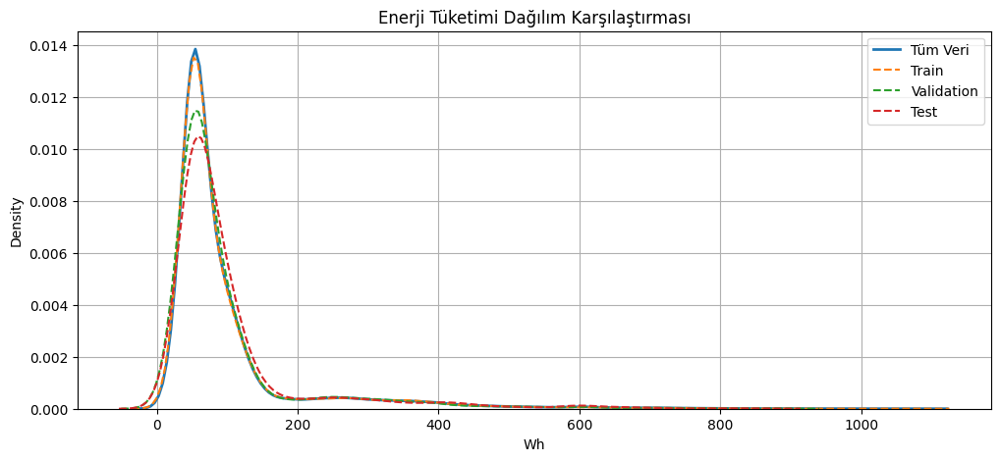

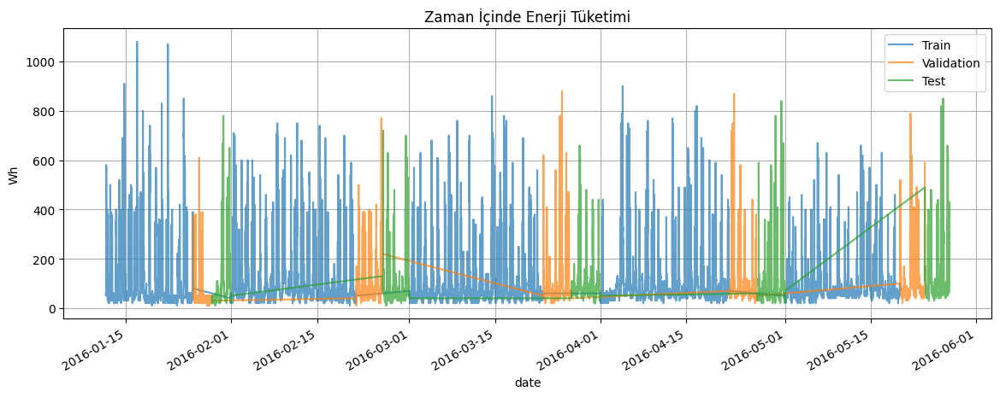


 Train Seti - Enerji Tüketimi İstatistikleri
- Ortalama: 97.15
- Medyan: 60.0
- Minimum: 10
- Maksimum: 1080
- Standart Sapma: 102.27
- Varyans: 10459.02
- Çarpıklık (Skewness): 3.4
- Basıklık (Kurtosis): 13.94

 Validation Seti - Enerji Tüketimi İstatistikleri
- Ortalama: 95.91
- Medyan: 60.0
- Minimum: 10
- Maksimum: 880
- Standart Sapma: 100.38
- Varyans: 10075.92
- Çarpıklık (Skewness): 3.42
- Basıklık (Kurtosis): 13.99

 Test Seti - Enerji Tüketimi İstatistikleri
- Ortalama: 102.01
- Medyan: 70.0
- Minimum: 10
- Maksimum: 850
- Standart Sapma: 105.71
- Varyans: 11173.75
- Çarpıklık (Skewness): 3.28
- Basıklık (Kurtosis): 12.27


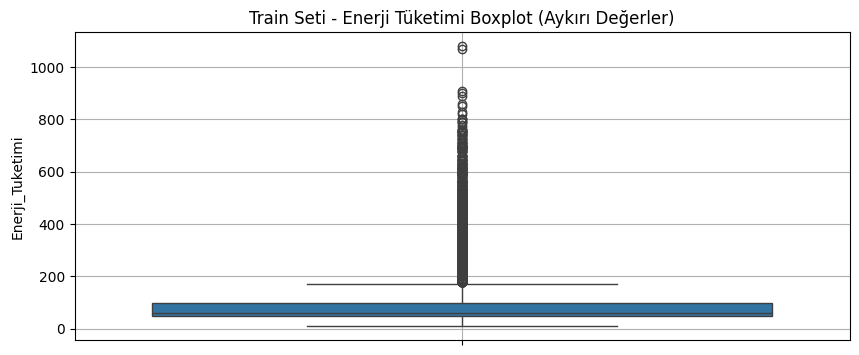

In [3]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ay ve yil bilgilerini ekleme
df['Yil'] = df.index.year
df['Ay'] = df.index.month

# mevsim bilgisi
def mevsim_ata(ay):
    if ay in [12, 1, 2]:
        return 'Kis'
    elif ay in [3, 4, 5]:
        return 'Ilkbahar'
    elif ay in [6, 7, 8]:
        return 'Yaz'
    else:
        return 'Sonbahar'

df['Mevsim'] = df['Ay'].apply(mevsim_ata)
df['HaftaGunu'] = df.index.dayofweek


gun_isimleri = {
    0: 'Pzt',
    1: 'Salı',
    2: 'Çrş',
    3: 'Per',
    4: 'Cuma',
    5: 'Cmt',
    6: 'Paz'
}
df['HaftaGunu_Adi'] = df['HaftaGunu'].map(gun_isimleri)


ay_isimleri = {
    1: 'Ocak',
    2: 'Şubat',
    3: 'Mart',
    4: 'Nisan',
    5: 'Mayıs',
    6: 'Haziran',
    7: 'Temmuz',
    8: 'Ağustos',
    9: 'Eylül',
    10: 'Ekim',
    11: 'Kasım',
    12: 'Aralık'
}
df['Ay_Adi'] = df['Ay'].map(ay_isimleri)


# her ay için train/val/test oranlı şekilde ayırma
train_parts = []
val_parts = []
test_parts = []

for (yil, ay), grup in df.groupby(['Yil', 'Ay']):
    grup = grup.sort_index()
    toplam = len(grup)

    train_end = int(toplam * 0.7)
    val_end = train_end + int(toplam * 0.15)

    train_parts.append(grup.iloc[:train_end])
    val_parts.append(grup.iloc[train_end:val_end])
    test_parts.append(grup.iloc[val_end:])

# grupları birleştirme
df_train = pd.concat(train_parts)
df_val = pd.concat(val_parts)
df_test = pd.concat(test_parts)

df_train['HaftaGunu_Adi'] = df_train['HaftaGunu'].map(gun_isimleri)
df_val['HaftaGunu_Adi'] = df_val['HaftaGunu'].map(gun_isimleri)
df_test['HaftaGunu_Adi'] = df_test['HaftaGunu'].map(gun_isimleri)

df_train['Ay_Adi'] = df_train['Ay'].map(ay_isimleri)
df_val['Ay_Adi'] = df_val['Ay'].map(ay_isimleri)
df_test['Ay_Adi'] = df_test['Ay'].map(ay_isimleri)


# her setin boyutları
print("Train boyutu:", df_train.shape)
print("Validation boyutu:", df_val.shape)
print("Test boyutu:", df_test.shape)

# her setin zaman aralığı
print("\n Zaman Aralıkları:")
print("Train:", df_train.index.min(), "→", df_train.index.max())
print("Validation:", df_val.index.min(), "→", df_val.index.max())
print("Test:", df_test.index.min(), "→", df_test.index.max())

# mevsimsel dağılım oranları
def yazdir_mevsim_dagilimi(veri, isim):
    print(f"\n {isim} Mevsim Dağılımı:")
    print(veri['Mevsim'].value_counts(normalize=True) * 100)

yazdir_mevsim_dagilimi(df_train, "Train")
yazdir_mevsim_dagilimi(df_val, "Validation")
yazdir_mevsim_dagilimi(df_test, "Test")

# Enerji_Tuketimi dağılım grafiği
plt.figure(figsize=(12,5))
sns.kdeplot(df['Enerji_Tuketimi'], label='Tüm Veri', linewidth=2)
sns.kdeplot(df_train['Enerji_Tuketimi'], label='Train', linestyle='--')
sns.kdeplot(df_val['Enerji_Tuketimi'], label='Validation', linestyle='--')
sns.kdeplot(df_test['Enerji_Tuketimi'], label='Test', linestyle='--')
plt.title("Enerji Tüketimi Dağılım Karşılaştırması")
plt.xlabel("Wh")
plt.legend()
plt.grid(True)
plt.show()

# zaman içinde Enerji Tüketimi
plt.figure(figsize=(14,5))
df_train['Enerji_Tuketimi'].plot(label='Train', alpha=0.7)
df_val['Enerji_Tuketimi'].plot(label='Validation', alpha=0.7)
df_test['Enerji_Tuketimi'].plot(label='Test', alpha=0.7)
plt.title("Zaman İçinde Enerji Tüketimi")
plt.ylabel("Wh")
plt.legend()
plt.grid(True)
plt.show()

# her set için detaylı istatistikler
def enerji_tuketimi_istatistikleri(veri, isim):
    print(f"\n {isim} Seti - Enerji Tüketimi İstatistikleri")
    print("- Ortalama:", round(veri['Enerji_Tuketimi'].mean(), 2))
    print("- Medyan:", round(veri['Enerji_Tuketimi'].median(), 2))
    print("- Minimum:", veri['Enerji_Tuketimi'].min())
    print("- Maksimum:", veri['Enerji_Tuketimi'].max())
    print("- Standart Sapma:", round(veri['Enerji_Tuketimi'].std(), 2))
    print("- Varyans:", round(veri['Enerji_Tuketimi'].var(), 2))
    print("- Çarpıklık (Skewness):", round(veri['Enerji_Tuketimi'].skew(), 2))
    print("- Basıklık (Kurtosis):", round(veri['Enerji_Tuketimi'].kurt(), 2))

enerji_tuketimi_istatistikleri(df_train, "Train")
enerji_tuketimi_istatistikleri(df_val, "Validation")
enerji_tuketimi_istatistikleri(df_test, "Test")

# aykırı değer boxplot (Train)
plt.figure(figsize=(10,4))
sns.boxplot(data=df_train['Enerji_Tuketimi'])
plt.title("Train Seti - Enerji Tüketimi Boxplot (Aykırı Değerler)")
plt.grid(True)
plt.show()


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# saatlik ortalama
def saatlik_ortalama(df, set_adi):
    saatlik_df = df.copy()
    saatlik_df['Saat'] = saatlik_df.index.hour
    saatlik_ort = saatlik_df.groupby('Saat')['Enerji_Tuketimi'].mean()

    plt.figure(figsize=(8,4))
    sns.lineplot(x=saatlik_ort.index, y=saatlik_ort.values, marker='o')
    plt.title(f"{set_adi} - Saatlik Ortalama Enerji Tüketimi")
    plt.xlabel("Saat")
    plt.ylabel("Ortalama Tüketim (Wh)")
    plt.grid(True)
    plt.xticks(range(0,24))
    plt.show()

# Günlük ortalama
def gunluk_ortalama(df, set_adi):
    gunluk_df = df['Enerji_Tuketimi'].resample('D').mean()

    plt.figure(figsize=(14,4))
    gunluk_df.plot()
    plt.title(f"{set_adi} - Günlük Ortalama Enerji Tüketimi")
    plt.ylabel("Wh")
    plt.xlabel("Tarih")
    plt.grid(True)
    plt.show()

# Haftalık ortalama günlere göre
def haftalik_ortalama(df, set_adi):
    df_copy = df.copy()
    df_copy['HaftaGunu'] = df_copy.index.dayofweek
    ort = df_copy.groupby('HaftaGunu')['Enerji_Tuketimi'].mean()
    gunler = ['Pzt', 'Salı', 'Çrş', 'Per', 'Cuma', 'Cmt', 'Paz']

    plt.figure(figsize=(8,4))
    sns.barplot(x=gunler, y=ort.values)
    plt.title(f"{set_adi} - Haftalık Ortalama Enerji Tüketimi")
    plt.ylabel("Wh")
    plt.xlabel("Gün")
    plt.grid(True)
    plt.show()

# Aylık ortalama
def aylik_ortalama(df, set_adi):
    df_copy = df.copy()
    df_copy['Ay'] = df_copy.index.month
    ort = df_copy.groupby('Ay')['Enerji_Tuketimi'].mean()
    aylar = ['Oca', 'Şub', 'Mar', 'Nis', 'May']

    plt.figure(figsize=(8,4))
    sns.barplot(x=aylar[:len(ort)], y=ort.values)
    plt.title(f"{set_adi} - Aylık Ortalama Enerji Tüketimi")
    plt.ylabel("Wh")
    plt.xlabel("Ay")
    plt.grid(True)
    plt.show()



📊 Train Seti - Zaman Temelli Analizler
--------------------------------------------------


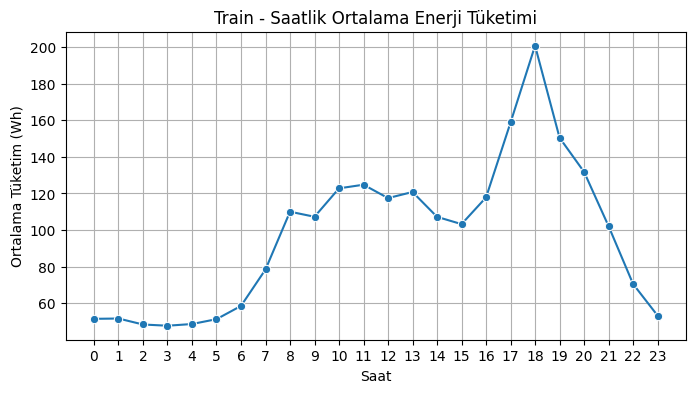

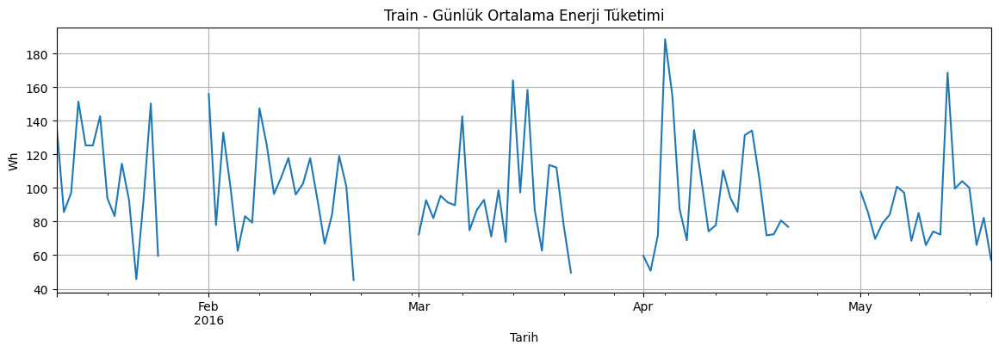

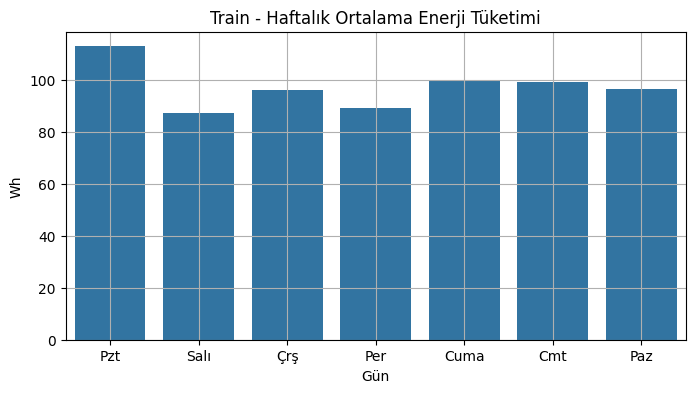

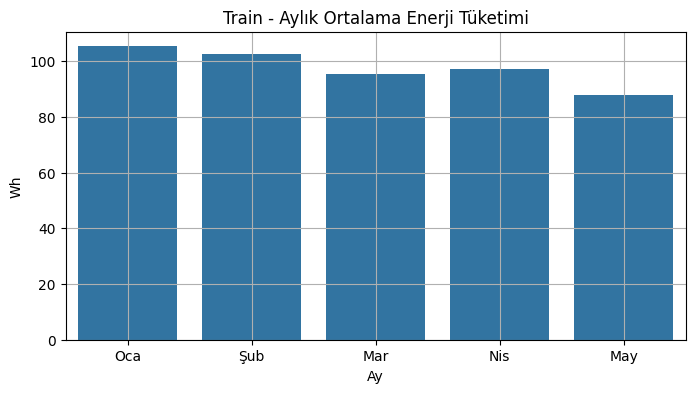


📊 Validation Seti - Zaman Temelli Analizler
--------------------------------------------------


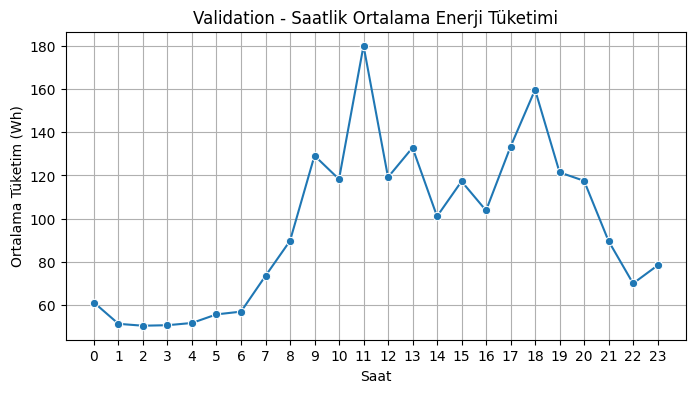

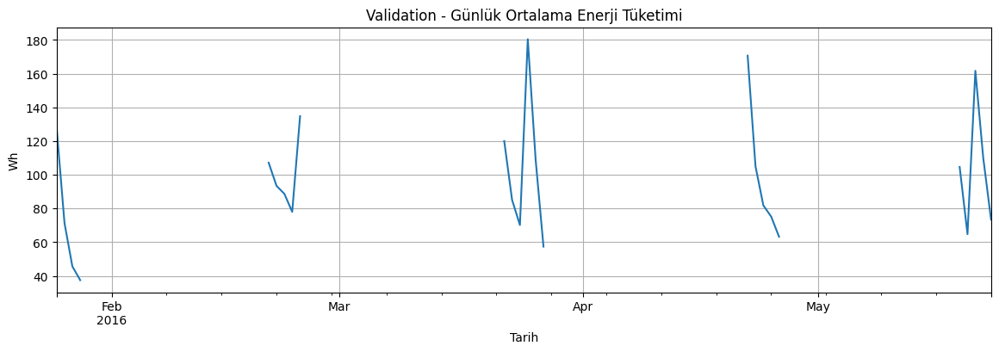

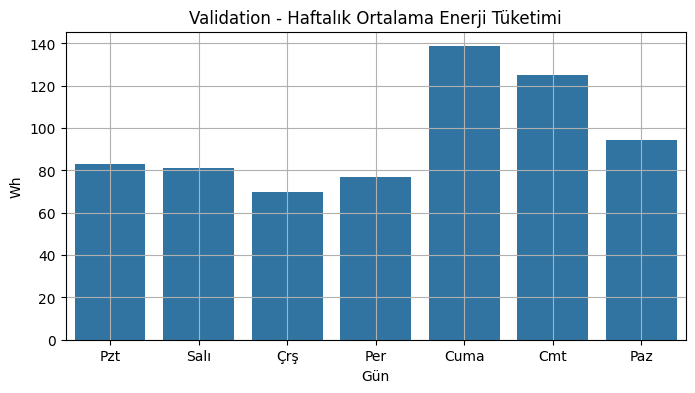

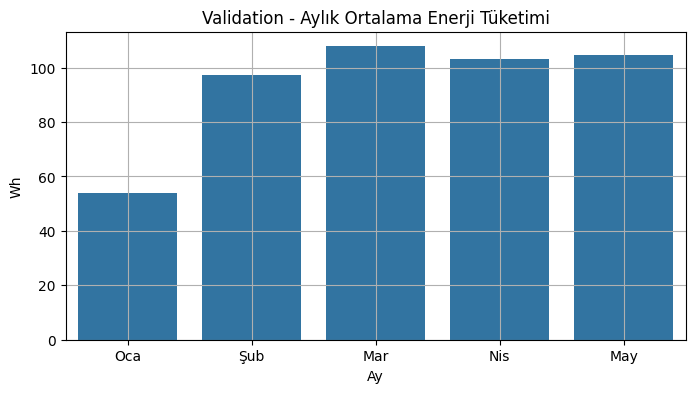


📊 Test Seti - Zaman Temelli Analizler
--------------------------------------------------


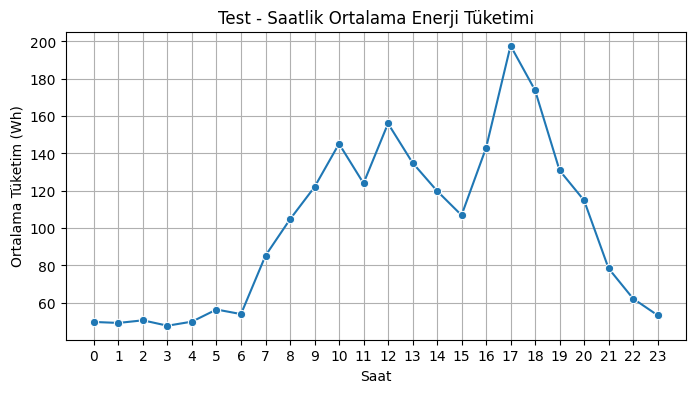

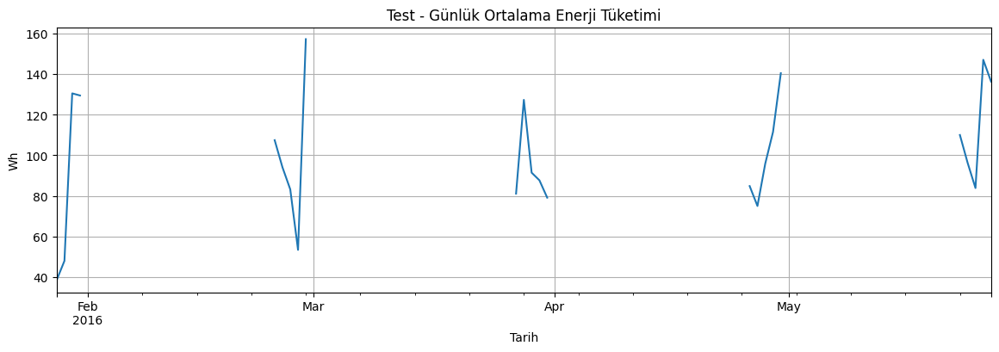

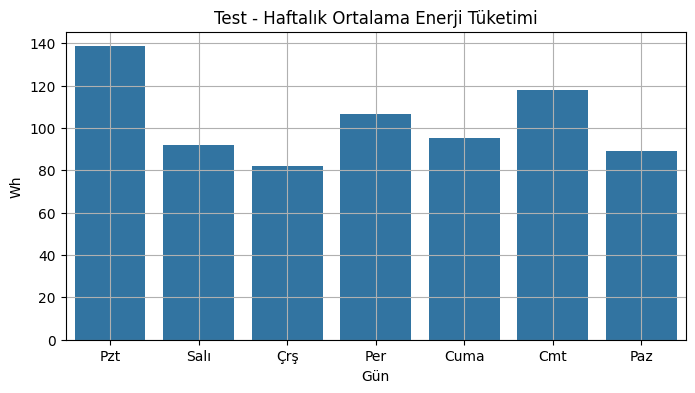

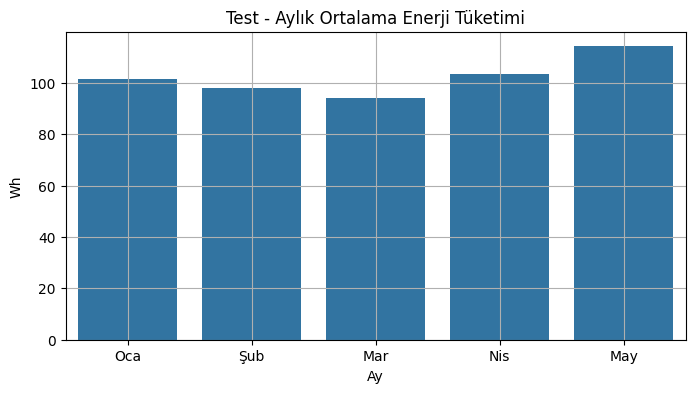

In [ ]:
for veri_seti, adi in [(df_train, "Train"), (df_val, "Validation"), (df_test, "Test")]:
    print(f"\n📊 {adi} Seti - Zaman Temelli Analizler\n" + "-"*50)
    saatlik_ortalama(veri_seti, adi)
    gunluk_ortalama(veri_seti, adi)
    haftalik_ortalama(veri_seti, adi)
    aylik_ortalama(veri_seti, adi)



 Train - Enerji_Tuketimi için istatistikler
Ortalama: 97.15
Medyan: 60.0
Minimum: 10
Maksimum: 1080
Standart Sapma: 102.27
Varyans: 10459.02


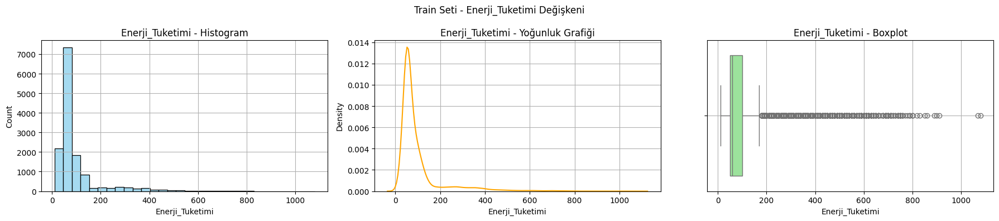


 Train - Aydinlatma_Tuketimi için istatistikler
Ortalama: 3.94
Medyan: 0.0
Minimum: 0
Maksimum: 70
Standart Sapma: 8.04
Varyans: 64.68


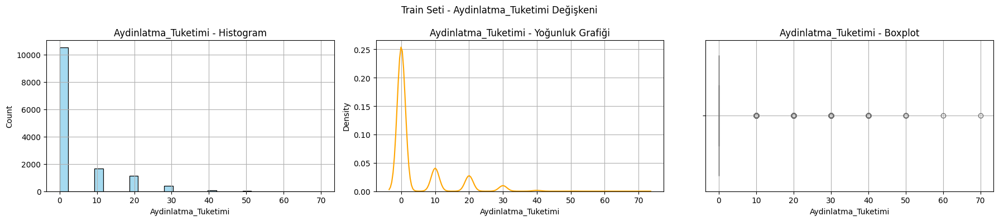


 Train - Sicaklik_Mutfak için istatistikler
Ortalama: 21.65
Medyan: 21.6
Minimum: 16.79
Maksimum: 26.26
Standart Sapma: 1.63
Varyans: 2.67


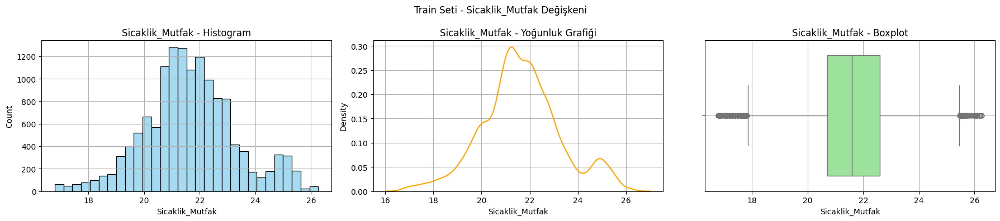


 Train - Nem_Mutfak için istatistikler
Ortalama: 40.05
Medyan: 39.59
Minimum: 27.0233333333333
Maksimum: 57.6633333333333
Standart Sapma: 3.82
Varyans: 14.6


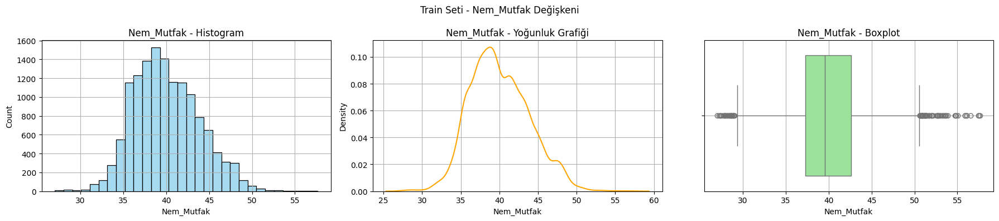


 Train - Sicaklik_Salon için istatistikler
Ortalama: 20.37
Medyan: 20.1
Minimum: 16.1
Maksimum: 29.8566666666667
Standart Sapma: 2.29
Varyans: 5.25


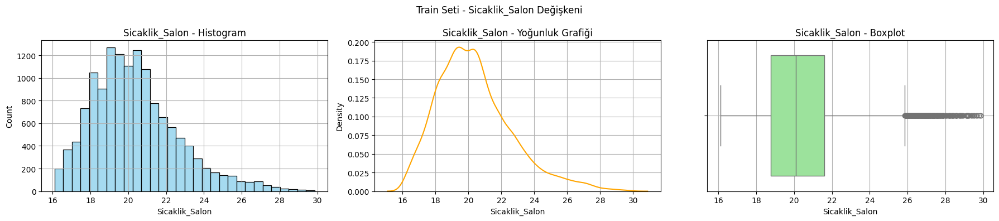


 Train - Nem_Salon için istatistikler
Ortalama: 40.07
Medyan: 40.2
Minimum: 20.463333333333296
Maksimum: 56.0266666666667
Standart Sapma: 4.05
Varyans: 16.39


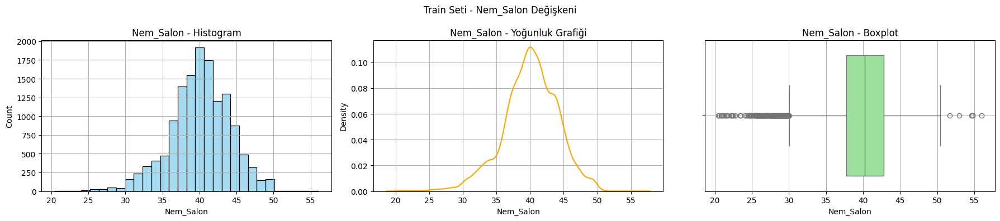


 Train - Sicaklik_CamasirOdasi için istatistikler
Ortalama: 22.12
Medyan: 22.0
Minimum: 17.2
Maksimum: 29.236
Standart Sapma: 1.97
Varyans: 3.89


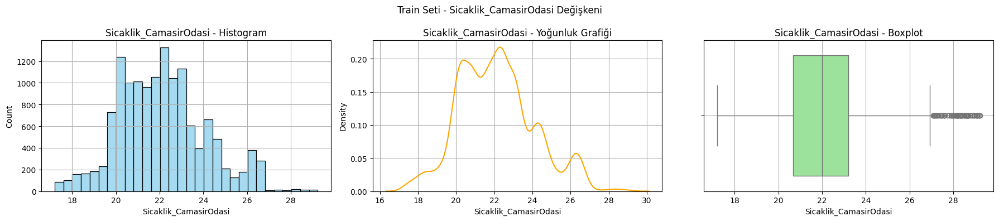


 Train - Nem_CamasirOdasi için istatistikler
Ortalama: 39.22
Medyan: 38.59
Minimum: 28.7666666666667
Maksimum: 50.1633333333333
Standart Sapma: 3.19
Varyans: 10.19


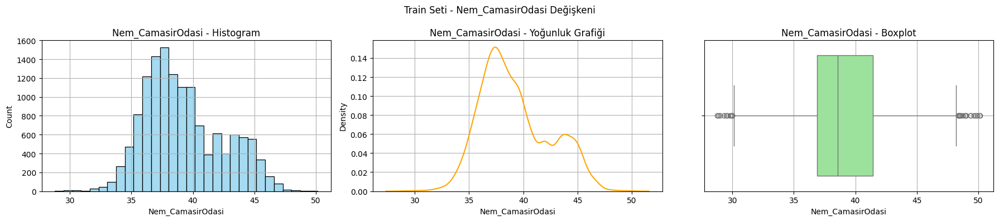


 Train - Sicaklik_Ofis için istatistikler
Ortalama: 20.81
Medyan: 20.67
Minimum: 15.1
Maksimum: 26.2
Standart Sapma: 2.11
Varyans: 4.44


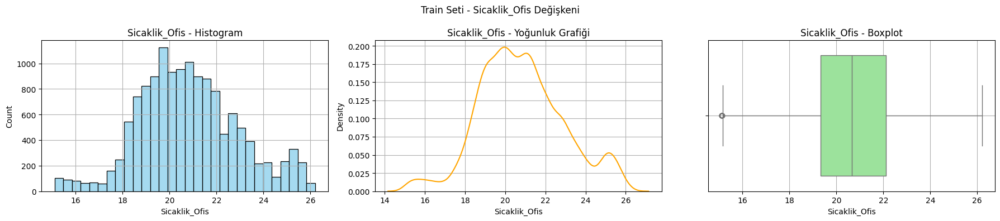


 Train - Nem_Ofis için istatistikler
Ortalama: 38.77
Medyan: 38.16
Minimum: 27.66
Maksimum: 51.0633333333333
Standart Sapma: 4.19
Varyans: 17.54


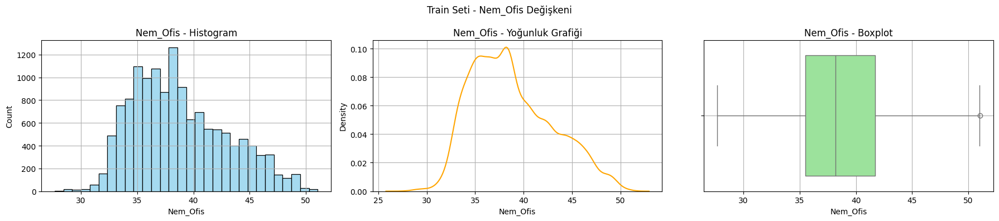


 Train - Sicaklik_Banyo için istatistikler
Ortalama: 19.54
Medyan: 19.29
Minimum: 15.33
Maksimum: 25.795
Standart Sapma: 1.88
Varyans: 3.53


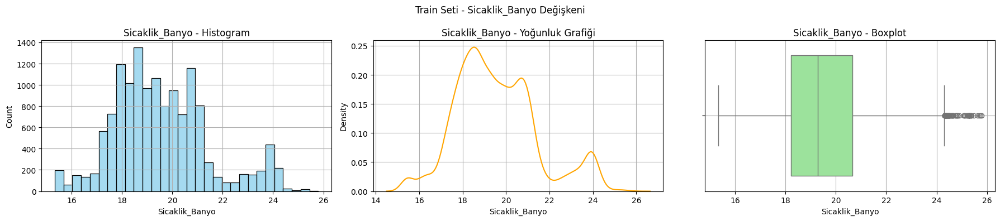


 Train - Nem_Banyo için istatistikler
Ortalama: 50.82
Medyan: 48.73
Minimum: 29.815
Maksimum: 96.3216666666667
Standart Sapma: 9.17
Varyans: 84.09


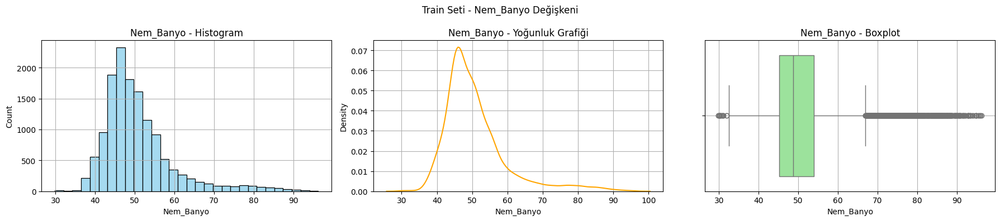


 Train - Sicaklik_DisKuzey için istatistikler
Ortalama: 7.6
Medyan: 6.73
Minimum: -6.065
Maksimum: 28.29
Standart Sapma: 6.27
Varyans: 39.33


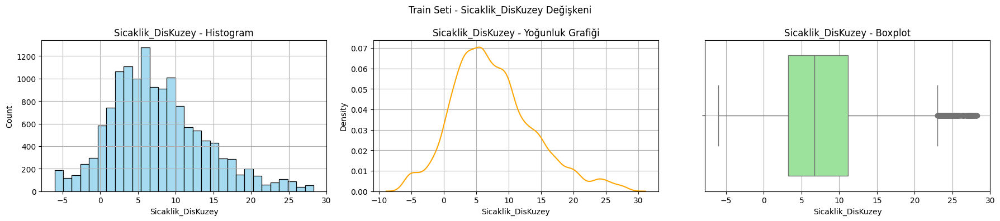


 Train - Nem_DisKuzey için istatistikler
Ortalama: 55.63
Medyan: 58.1
Minimum: 1.0
Maksimum: 99.9
Standart Sapma: 31.93
Varyans: 1019.41


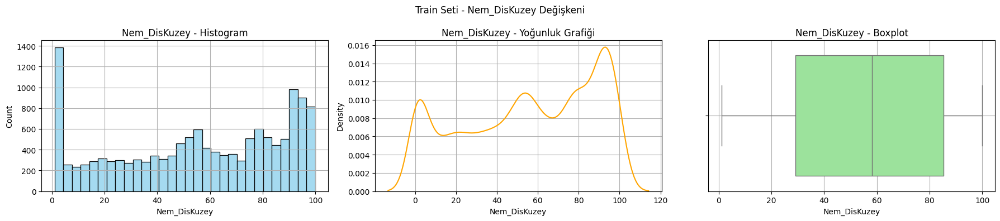


 Train - Sicaklik_UtuOdasi için istatistikler
Ortalama: 20.2
Medyan: 19.92
Minimum: 15.39
Maksimum: 26.0
Standart Sapma: 2.17
Varyans: 4.69


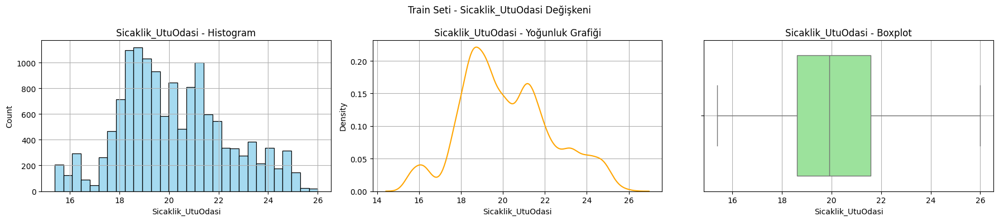


 Train - Nem_UtuOdasi için istatistikler
Ortalama: 34.96
Medyan: 34.59
Minimum: 23.39
Maksimum: 51.4
Standart Sapma: 4.97
Varyans: 24.74


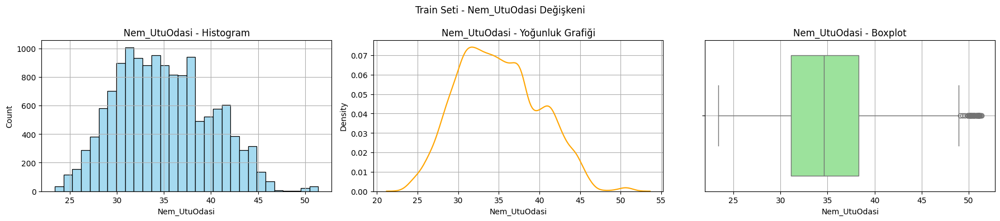


 Train - Sicaklik_GencOdasi için istatistikler
Ortalama: 22.0
Medyan: 22.0
Minimum: 16.3066666666667
Maksimum: 27.23
Standart Sapma: 1.93
Varyans: 3.71


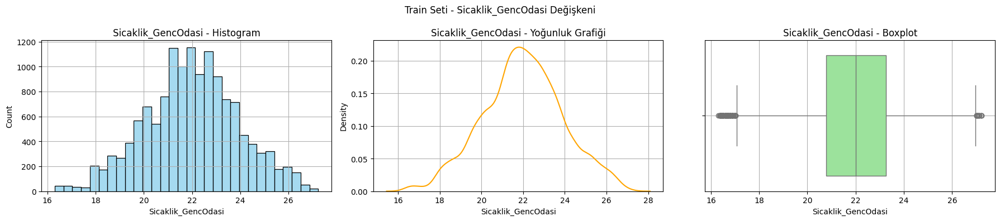


 Train - Nem_GencOdasi için istatistikler
Ortalama: 42.63
Medyan: 42.09
Minimum: 29.79
Maksimum: 58.78
Standart Sapma: 5.22
Varyans: 27.28


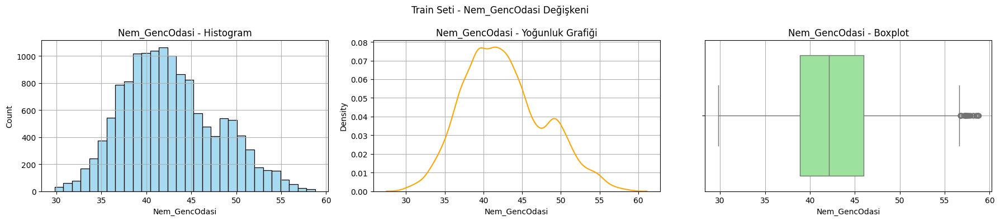


 Train - Sicaklik_EbeveynOdasi için istatistikler
Ortalama: 19.43
Medyan: 19.29
Minimum: 14.89
Maksimum: 24.5
Standart Sapma: 2.04
Varyans: 4.18


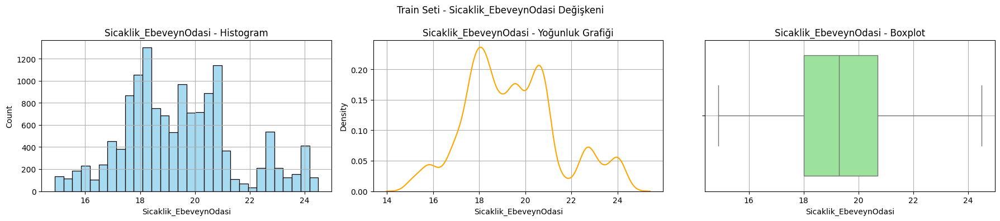


 Train - Nem_EbeveynOdasi için istatistikler
Ortalama: 41.46
Medyan: 40.76
Minimum: 29.85
Maksimum: 53.3266666666667
Standart Sapma: 4.01
Varyans: 16.07


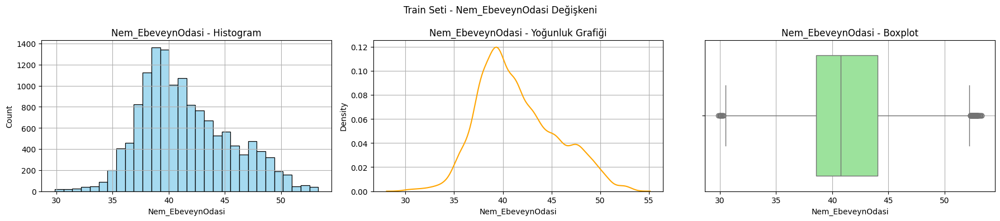


 Train - Sicaklik_DisHava için istatistikler
Ortalama: 7.18
Medyan: 6.55
Minimum: -5.0
Maksimum: 26.1
Standart Sapma: 5.56
Varyans: 30.96


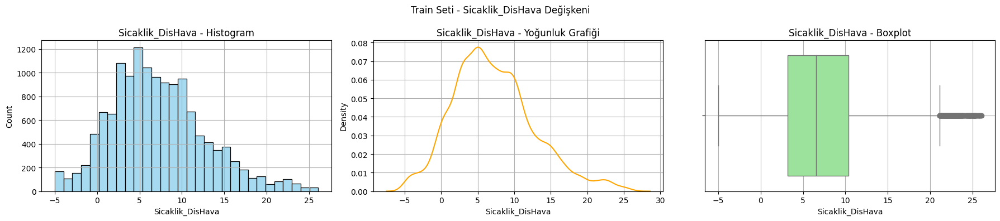


 Train - Basinc için istatistikler
Ortalama: 755.53
Medyan: 756.18
Minimum: 729.2999999999998
Maksimum: 772.2999999999998
Standart Sapma: 8.39
Varyans: 70.36


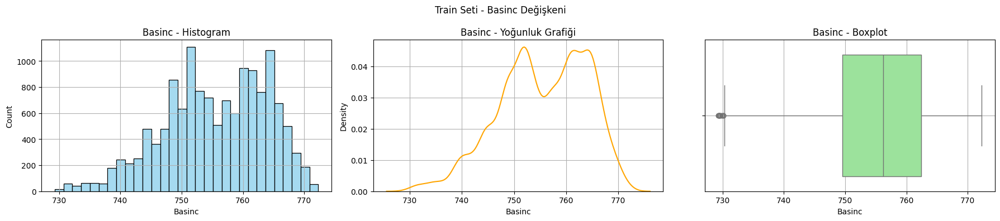


 Train - Nem_DisHava için istatistikler
Ortalama: 79.45
Medyan: 84.0
Minimum: 24.0
Maksimum: 100.0
Standart Sapma: 15.67
Varyans: 245.55


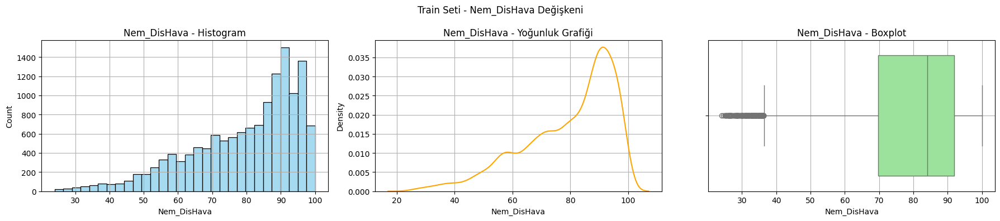


 Train - Ruzgar_Hizi için istatistikler
Ortalama: 3.85
Medyan: 3.33
Minimum: 0.0
Maksimum: 14.0
Standart Sapma: 2.33
Varyans: 5.44


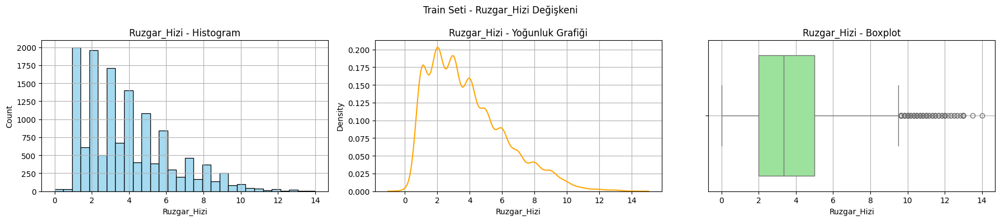


 Train - Gorus_Mesafesi için istatistikler
Ortalama: 38.52
Medyan: 40.0
Minimum: 1.0
Maksimum: 66.0
Standart Sapma: 12.35
Varyans: 152.47


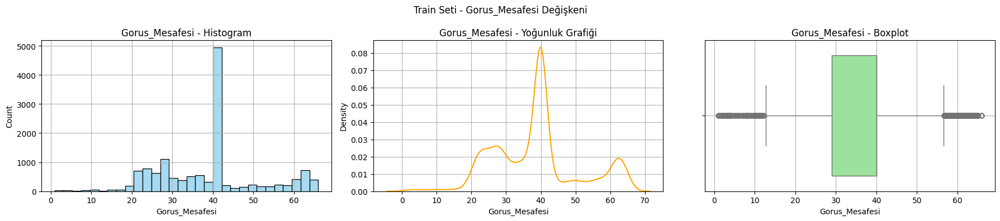


 Train - CiyNoktasi_Sicakligi için istatistikler
Ortalama: 3.43
Medyan: 2.9
Minimum: -6.6
Maksimum: 15.5
Standart Sapma: 4.11
Varyans: 16.91


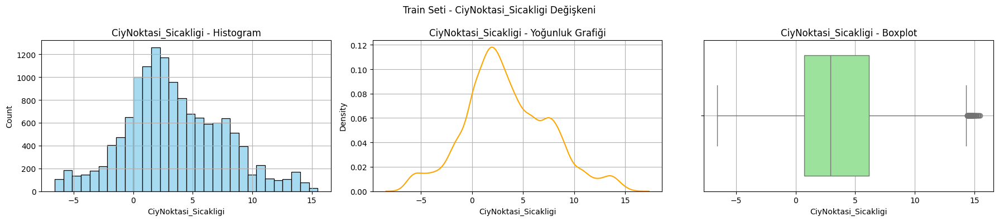


 Train - Rastgele_Degisken_1 için istatistikler
Ortalama: 24.87
Medyan: 24.69
Minimum: 0.0053216819651424
Maksimum: 49.9965296825394
Standart Sapma: 14.51
Varyans: 210.63


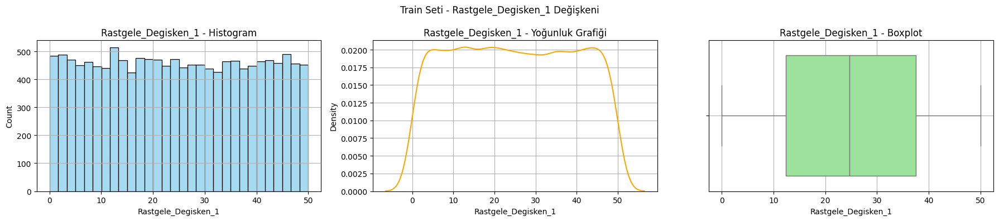


 Train - Rastgele_Degisken_2 için istatistikler
Ortalama: 24.87
Medyan: 24.69
Minimum: 0.0053216819651424
Maksimum: 49.9965296825394
Standart Sapma: 14.51
Varyans: 210.63


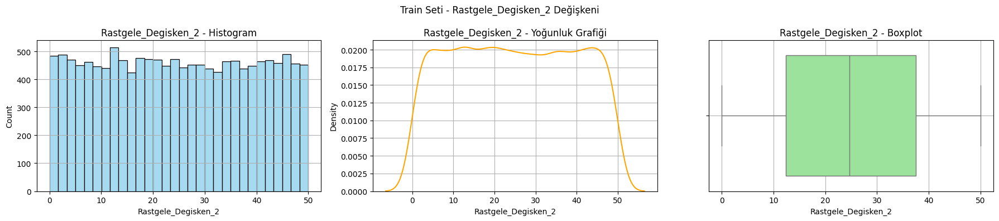


 Validation - Enerji_Tuketimi için istatistikler
Ortalama: 95.91
Medyan: 60.0
Minimum: 10
Maksimum: 880
Standart Sapma: 100.38
Varyans: 10075.92


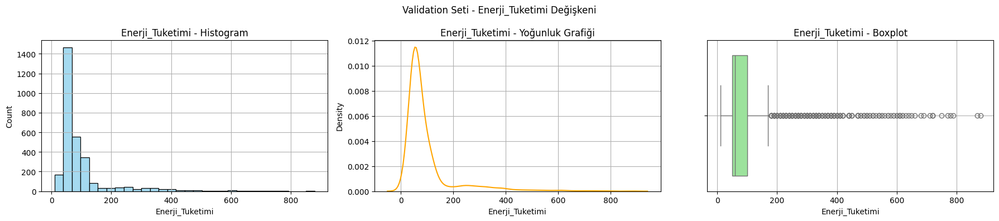


 Validation - Aydinlatma_Tuketimi için istatistikler
Ortalama: 3.87
Medyan: 0.0
Minimum: 0
Maksimum: 50
Standart Sapma: 8.01
Varyans: 64.11


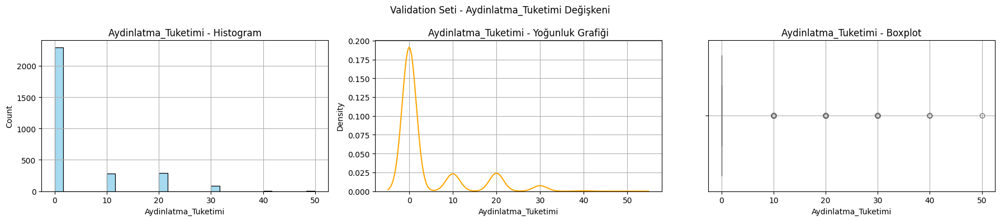


 Validation - Sicaklik_Mutfak için istatistikler
Ortalama: 21.83
Medyan: 21.7
Minimum: 18.6333333333333
Maksimum: 24.963333333333296
Standart Sapma: 1.42
Varyans: 2.03


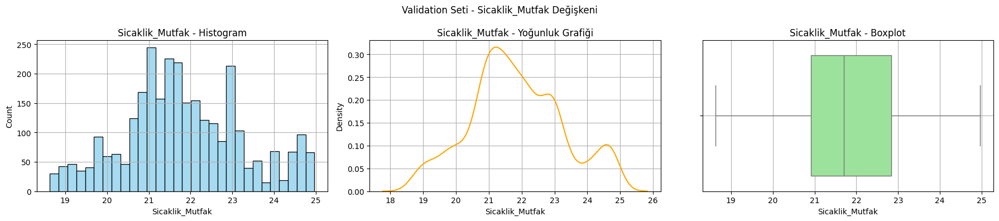


 Validation - Nem_Mutfak için istatistikler
Ortalama: 42.1
Medyan: 41.29
Minimum: 34.0666666666667
Maksimum: 57.395
Standart Sapma: 4.38
Varyans: 19.2


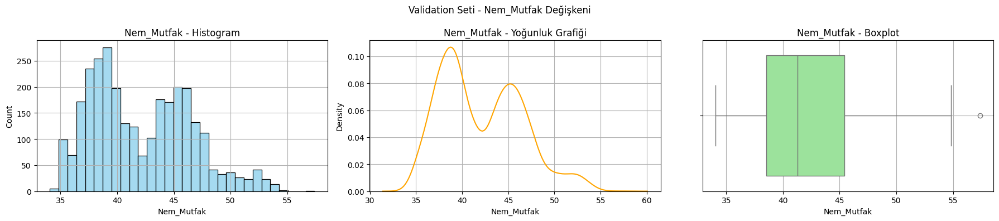


 Validation - Sicaklik_Salon için istatistikler
Ortalama: 20.28
Medyan: 19.79
Minimum: 17.4266666666667
Maksimum: 25.8566666666667
Standart Sapma: 1.77
Varyans: 3.13


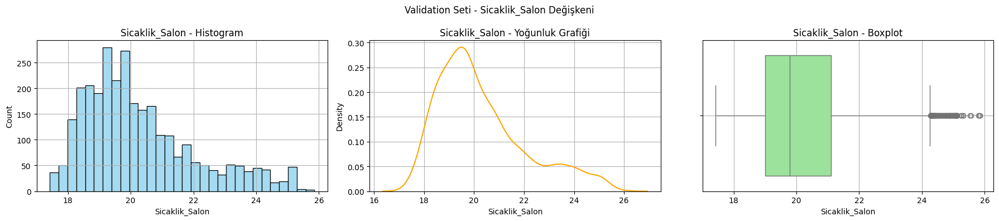


 Validation - Nem_Salon için istatistikler
Ortalama: 42.82
Medyan: 43.0
Minimum: 33.09
Maksimum: 54.09
Standart Sapma: 3.75
Varyans: 14.04


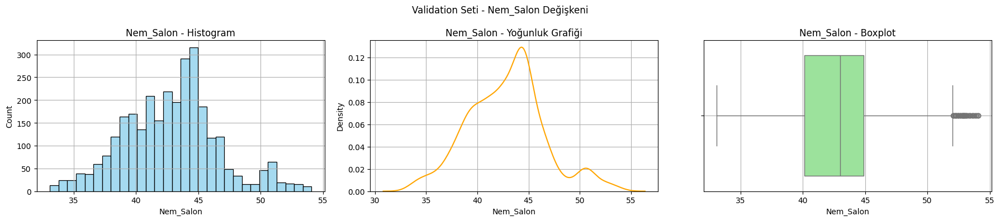


 Validation - Sicaklik_CamasirOdasi için istatistikler
Ortalama: 22.74
Medyan: 22.2
Minimum: 19.5
Maksimum: 28.1
Standart Sapma: 2.01
Varyans: 4.06


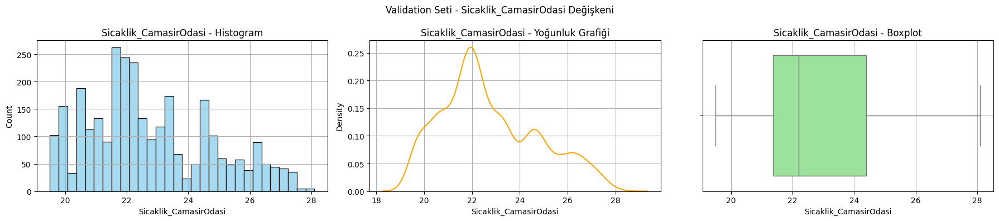


 Validation - Nem_CamasirOdasi için istatistikler
Ortalama: 40.16
Medyan: 39.53
Minimum: 32.7666666666667
Maksimum: 47.69333333333329
Standart Sapma: 3.5
Varyans: 12.23


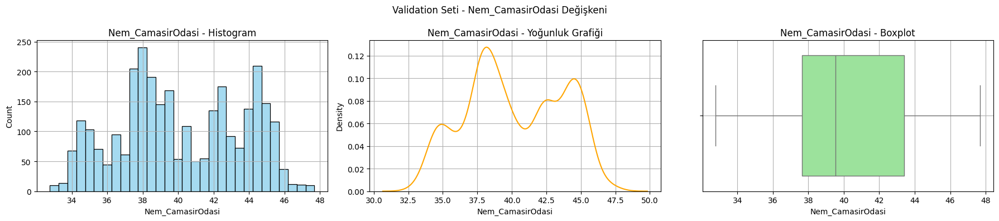


 Validation - Sicaklik_Ofis için istatistikler
Ortalama: 21.26
Medyan: 21.1
Minimum: 17.6
Maksimum: 24.29
Standart Sapma: 1.65
Varyans: 2.71


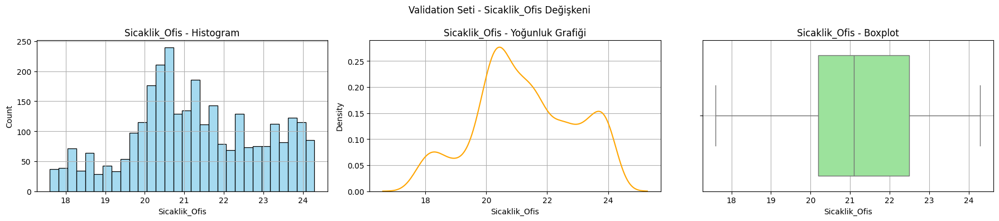


 Validation - Nem_Ofis için istatistikler
Ortalama: 40.6
Medyan: 40.09
Minimum: 31.79
Maksimum: 50.76
Standart Sapma: 4.81
Varyans: 23.17


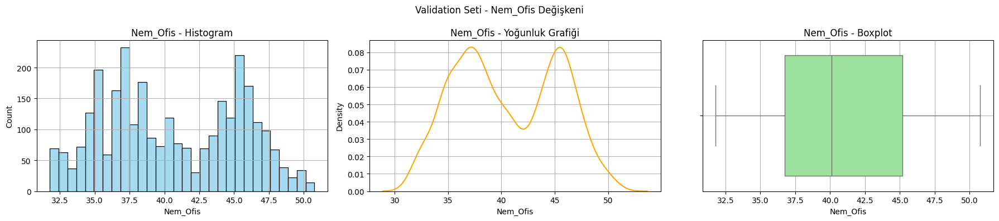


 Validation - Sicaklik_Banyo için istatistikler
Ortalama: 19.91
Medyan: 19.79
Minimum: 17.0
Maksimum: 24.456
Standart Sapma: 1.73
Varyans: 2.99


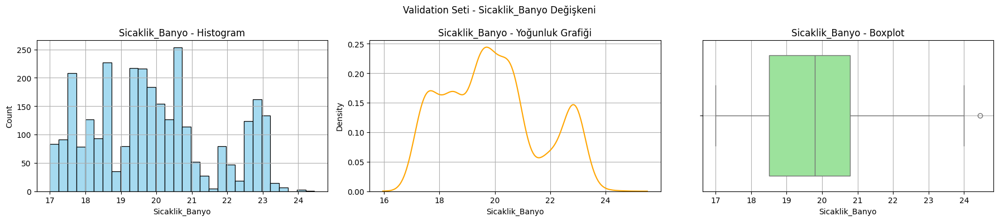


 Validation - Nem_Banyo için istatistikler
Ortalama: 51.63
Medyan: 50.8
Minimum: 39.2225
Maksimum: 93.554
Standart Sapma: 7.83
Varyans: 61.26


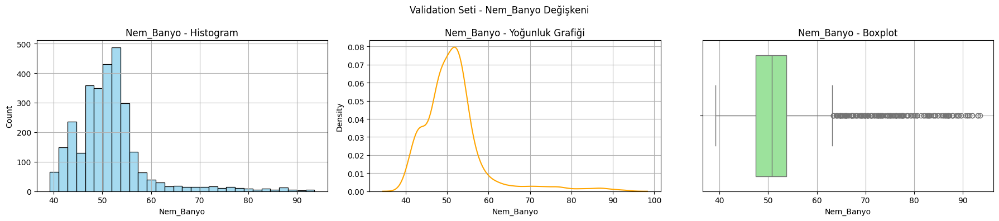


 Validation - Sicaklik_DisKuzey için istatistikler
Ortalama: 9.08
Medyan: 9.23
Minimum: -2.59
Maksimum: 25.5
Standart Sapma: 5.61
Varyans: 31.43


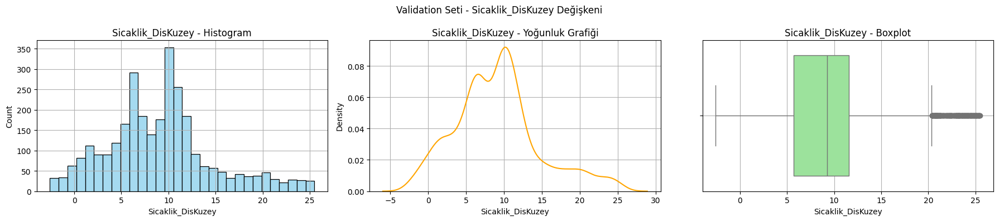


 Validation - Nem_DisKuzey için istatistikler
Ortalama: 57.59
Medyan: 55.38
Minimum: 1.0
Maksimum: 99.9
Standart Sapma: 28.74
Varyans: 826.08


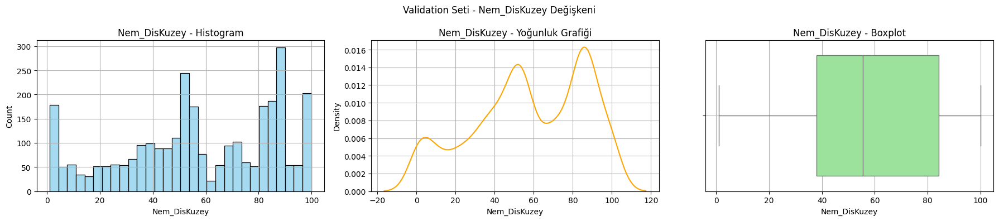


 Validation - Sicaklik_UtuOdasi için istatistikler
Ortalama: 20.52
Medyan: 20.39
Minimum: 17.29
Maksimum: 24.15
Standart Sapma: 1.88
Varyans: 3.54


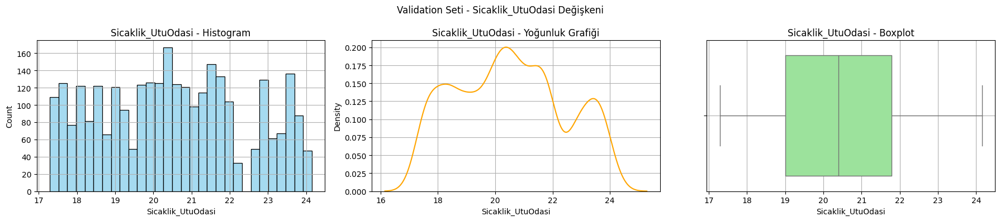


 Validation - Nem_UtuOdasi için istatistikler
Ortalama: 38.13
Medyan: 37.91
Minimum: 25.1
Maksimum: 48.29
Standart Sapma: 5.05
Varyans: 25.52


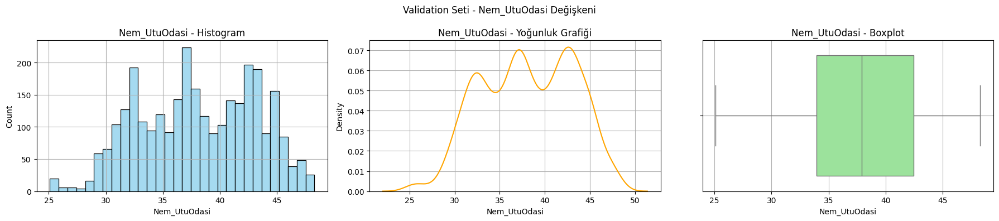


 Validation - Sicaklik_GencOdasi için istatistikler
Ortalama: 22.06
Medyan: 22.53
Minimum: 17.3233333333333
Maksimum: 26.29
Standart Sapma: 2.1
Varyans: 4.42


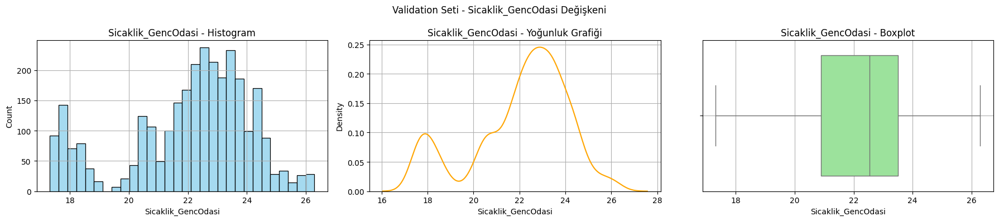


 Validation - Nem_GencOdasi için istatistikler
Ortalama: 44.92
Medyan: 44.86
Minimum: 32.1266666666667
Maksimum: 55.0
Standart Sapma: 4.95
Varyans: 24.49


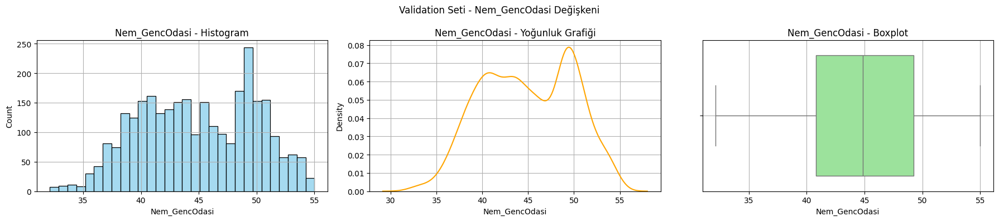


 Validation - Sicaklik_EbeveynOdasi için istatistikler
Ortalama: 19.77
Medyan: 19.7
Minimum: 16.7
Maksimum: 23.35
Standart Sapma: 1.9
Varyans: 3.59


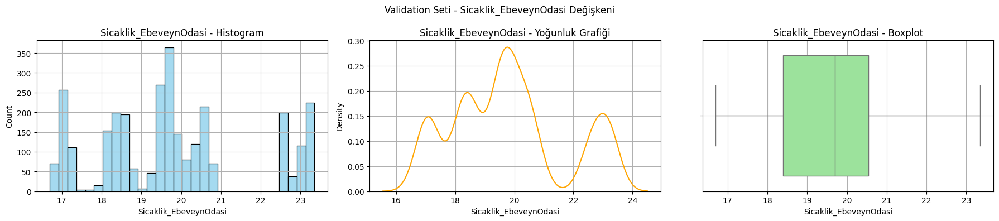


 Validation - Nem_EbeveynOdasi için istatistikler
Ortalama: 42.9
Medyan: 42.2
Minimum: 32.29
Maksimum: 51.536
Standart Sapma: 4.51
Varyans: 20.3


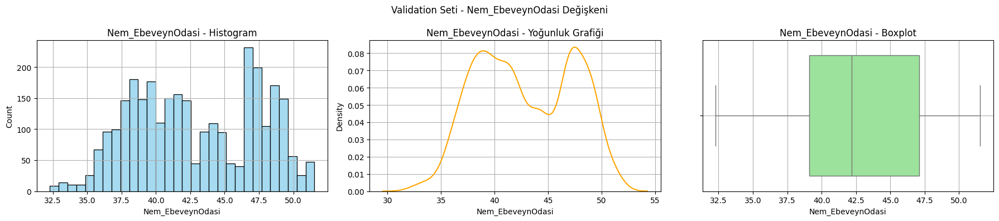


 Validation - Sicaklik_DisHava için istatistikler
Ortalama: 8.5
Medyan: 8.5
Minimum: -2.8
Maksimum: 23.1
Standart Sapma: 4.7
Varyans: 22.09


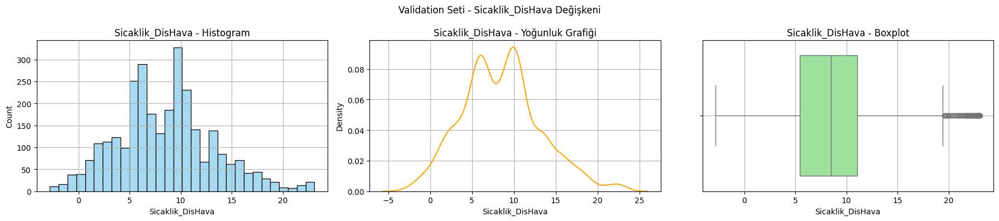


 Validation - Basinc için istatistikler
Ortalama: 756.15
Medyan: 756.4
Minimum: 746.5
Maksimum: 766.0
Standart Sapma: 3.71
Varyans: 13.79


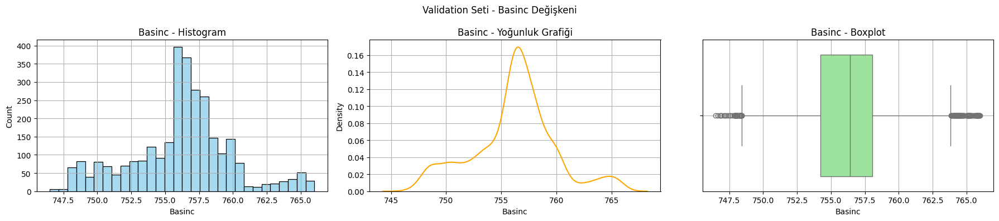


 Validation - Nem_DisHava için istatistikler
Ortalama: 83.16
Medyan: 86.92
Minimum: 46.0
Maksimum: 100.0
Standart Sapma: 12.0
Varyans: 143.9


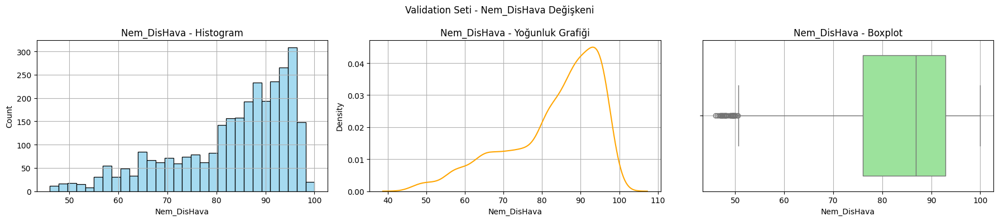


 Validation - Ruzgar_Hizi için istatistikler
Ortalama: 4.31
Medyan: 4.0
Minimum: 1.0
Maksimum: 11.0
Standart Sapma: 2.5
Varyans: 6.23


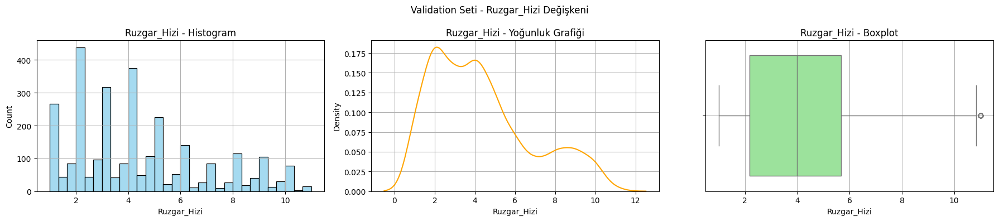


 Validation - Gorus_Mesafesi için istatistikler
Ortalama: 38.49
Medyan: 40.0
Minimum: 20.0
Maksimum: 65.0
Standart Sapma: 10.82
Varyans: 117.08


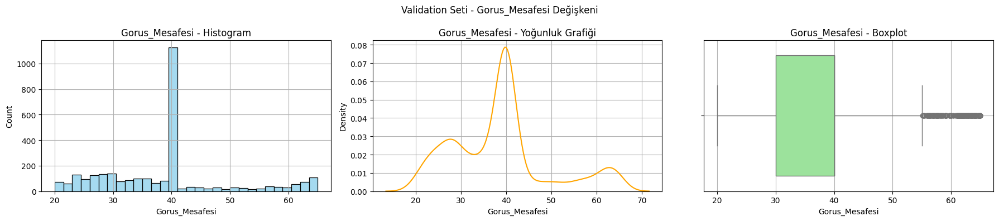


 Validation - CiyNoktasi_Sicakligi için istatistikler
Ortalama: 5.58
Medyan: 5.3
Minimum: -3.3
Maksimum: 15.1
Standart Sapma: 4.17
Varyans: 17.38


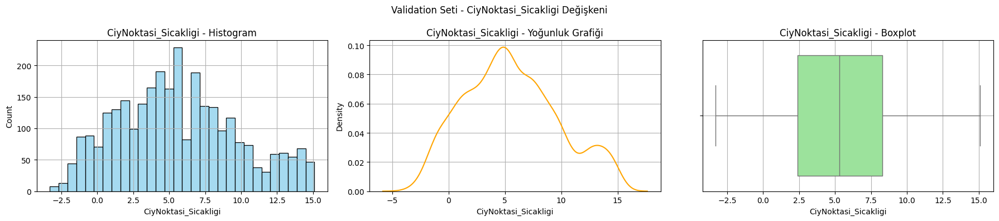


 Validation - Rastgele_Degisken_1 için istatistikler
Ortalama: 25.35
Medyan: 25.79
Minimum: 0.0328173977322876
Maksimum: 49.96114949462935
Standart Sapma: 14.39
Varyans: 206.98


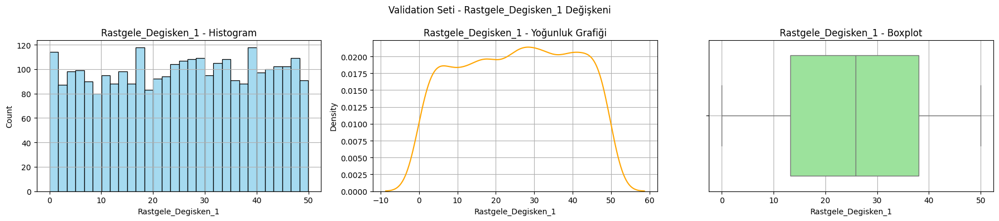


 Validation - Rastgele_Degisken_2 için istatistikler
Ortalama: 25.35
Medyan: 25.79
Minimum: 0.0328173977322876
Maksimum: 49.96114949462935
Standart Sapma: 14.39
Varyans: 206.98


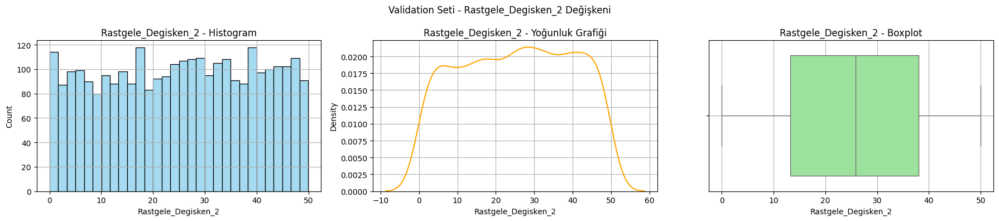


 Test - Enerji_Tuketimi için istatistikler
Ortalama: 102.01
Medyan: 70.0
Minimum: 10
Maksimum: 850
Standart Sapma: 105.71
Varyans: 11173.75


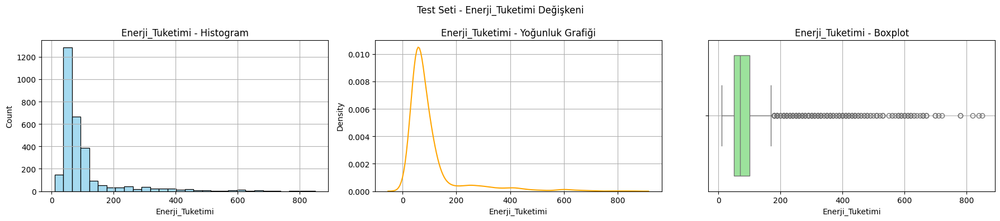


 Test - Aydinlatma_Tuketimi için istatistikler
Ortalama: 3.1
Medyan: 0.0
Minimum: 0
Maksimum: 50
Standart Sapma: 7.31
Varyans: 53.38


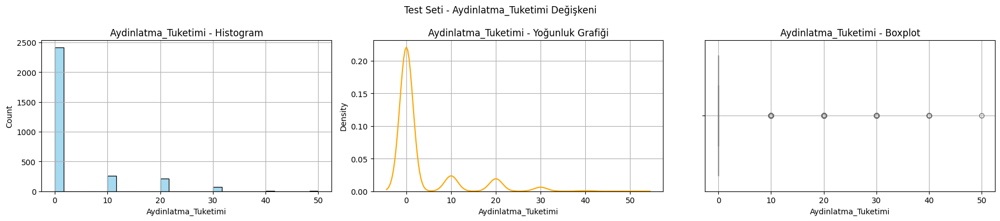


 Test - Sicaklik_Mutfak için istatistikler
Ortalama: 21.72
Medyan: 21.6
Minimum: 17.89
Maksimum: 25.6
Standart Sapma: 1.64
Varyans: 2.7


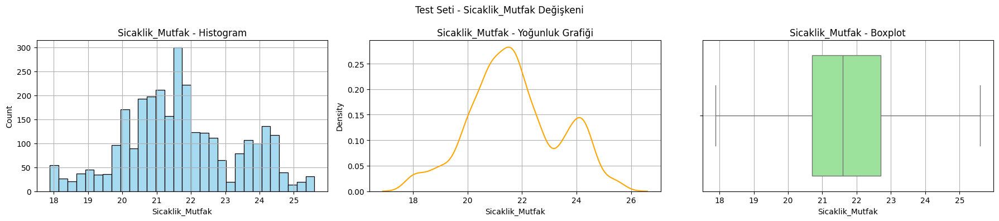


 Test - Nem_Mutfak için istatistikler
Ortalama: 39.38
Medyan: 38.93
Minimum: 31.4266666666667
Maksimum: 63.36
Standart Sapma: 3.73
Varyans: 13.88


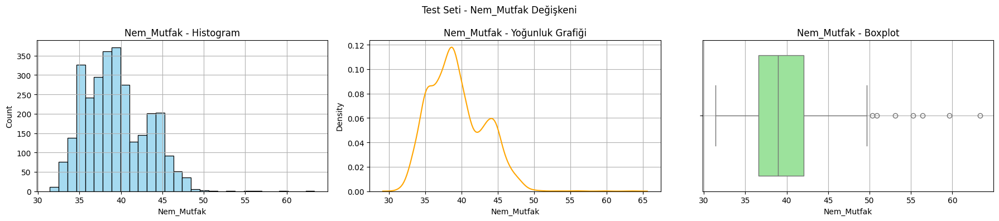


 Test - Sicaklik_Salon için istatistikler
Ortalama: 20.29
Medyan: 19.79
Minimum: 16.89
Maksimum: 27.7
Standart Sapma: 2.1
Varyans: 4.42


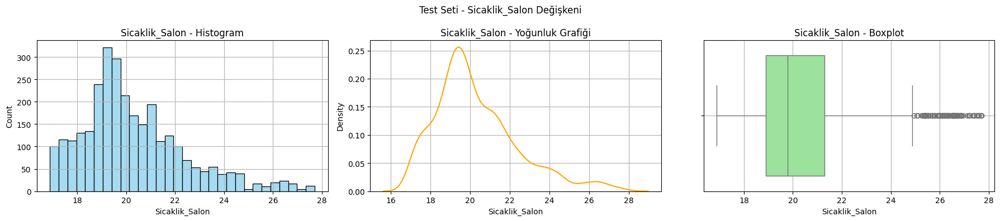


 Test - Nem_Salon için istatistikler
Ortalama: 39.64
Medyan: 39.81
Minimum: 31.3566666666667
Maksimum: 47.9666666666667
Standart Sapma: 3.6
Varyans: 12.96


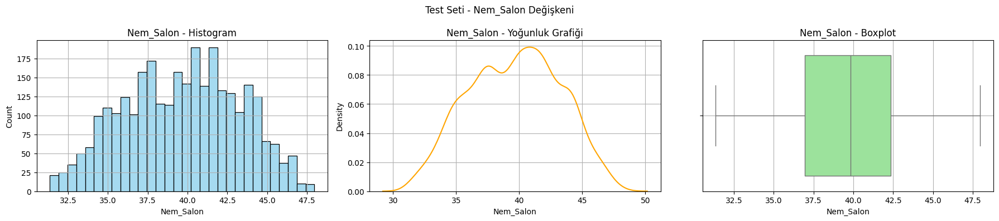


 Test - Sicaklik_CamasirOdasi için istatistikler
Ortalama: 22.49
Medyan: 22.33
Minimum: 18.823333333333295
Maksimum: 28.79
Standart Sapma: 2.06
Varyans: 4.23


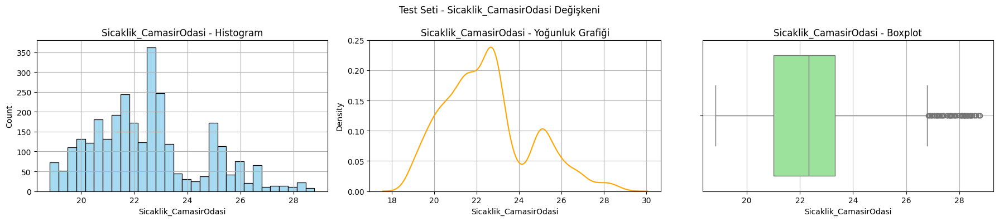


 Test - Nem_CamasirOdasi için istatistikler
Ortalama: 38.43
Medyan: 37.93
Minimum: 33.4333333333333
Maksimum: 49.56
Standart Sapma: 3.06
Varyans: 9.35


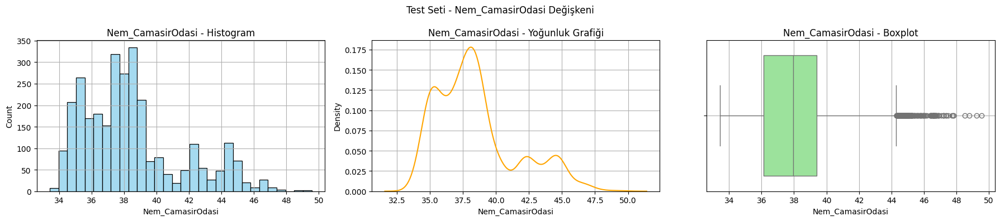


 Test - Sicaklik_Ofis için istatistikler
Ortalama: 20.66
Medyan: 20.39
Minimum: 16.39
Maksimum: 24.89
Standart Sapma: 2.05
Varyans: 4.2


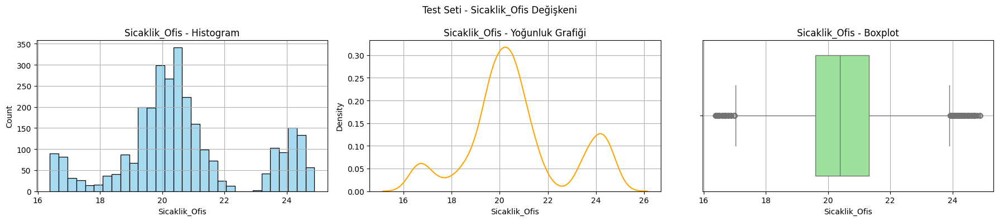


 Test - Nem_Ofis için istatistikler
Ortalama: 38.63
Medyan: 38.9
Minimum: 30.7233333333333
Maksimum: 51.09
Standart Sapma: 4.21
Varyans: 17.68


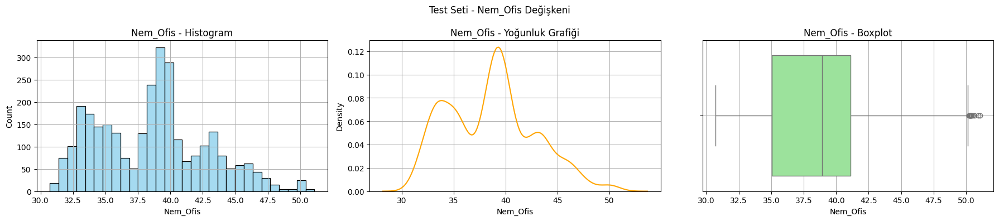


 Test - Sicaklik_Banyo için istatistikler
Ortalama: 19.5
Medyan: 19.29
Minimum: 16.6
Maksimum: 25.336
Standart Sapma: 1.77
Varyans: 3.12


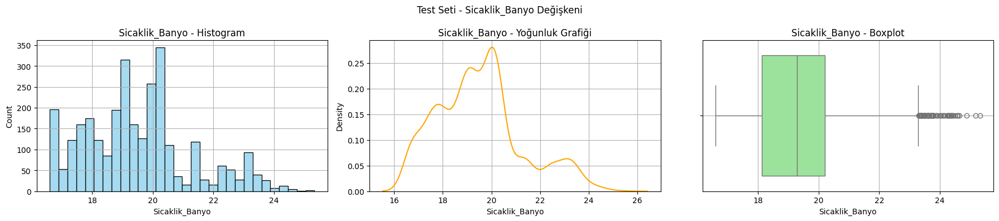


 Test - Nem_Banyo için istatistikler
Ortalama: 50.88
Medyan: 48.9
Minimum: 37.6685714285714
Maksimum: 92.8966666666667
Standart Sapma: 9.41
Varyans: 88.46


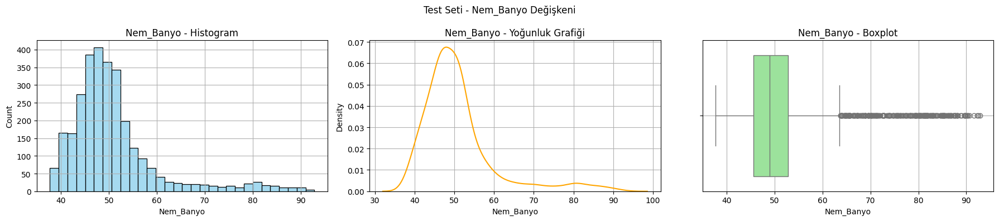


 Test - Sicaklik_DisKuzey için istatistikler
Ortalama: 8.18
Medyan: 7.88
Minimum: -1.9666666666666697
Maksimum: 26.7
Standart Sapma: 5.52
Varyans: 30.47


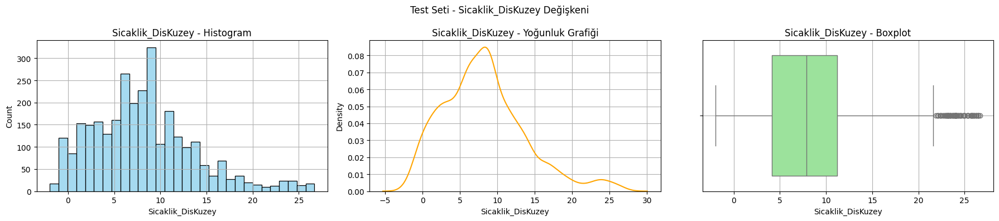


 Test - Nem_DisKuzey için istatistikler
Ortalama: 46.86
Medyan: 46.0
Minimum: 1.0
Maksimum: 99.9
Standart Sapma: 28.5
Varyans: 812.27


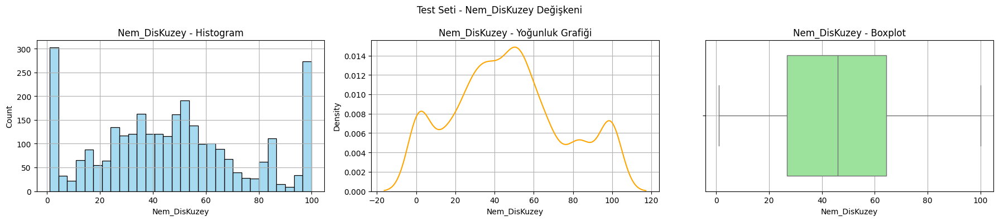


 Test - Sicaklik_UtuOdasi için istatistikler
Ortalama: 20.33
Medyan: 20.1
Minimum: 16.79
Maksimum: 24.5571428571429
Standart Sapma: 2.04
Varyans: 4.15


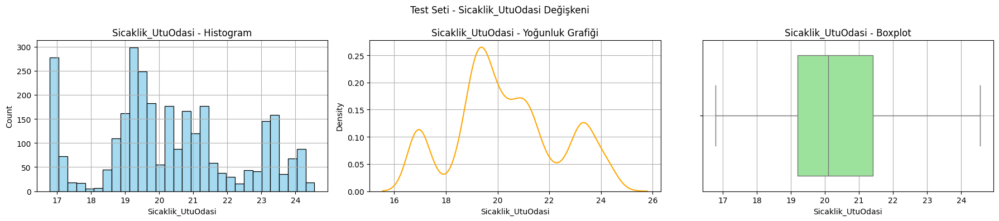


 Test - Nem_UtuOdasi için istatistikler
Ortalama: 34.67
Medyan: 34.09
Minimum: 23.2
Maksimum: 50.4
Standart Sapma: 4.95
Varyans: 24.51


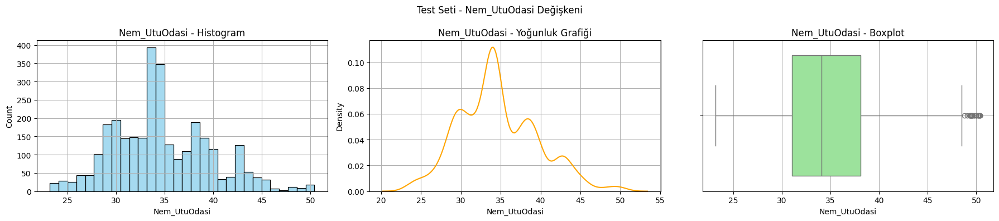


 Test - Sicaklik_GencOdasi için istatistikler
Ortalama: 22.15
Medyan: 22.39
Minimum: 16.89
Maksimum: 25.29
Standart Sapma: 1.94
Varyans: 3.77


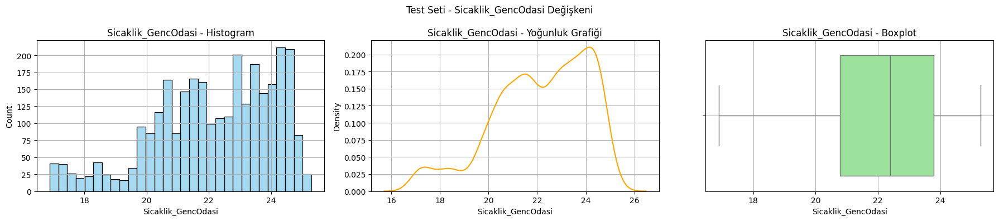


 Test - Nem_GencOdasi için istatistikler
Ortalama: 42.36
Medyan: 41.72
Minimum: 29.6
Maksimum: 55.63
Standart Sapma: 5.05
Varyans: 25.47


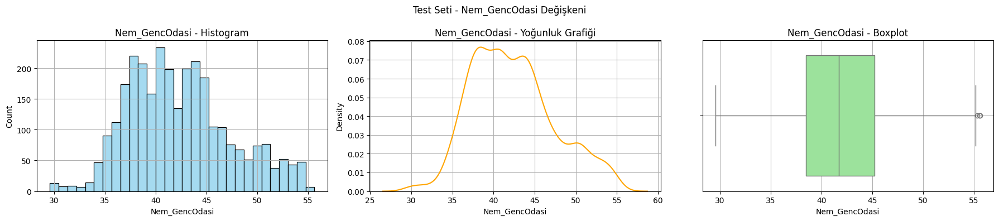


 Test - Sicaklik_EbeveynOdasi için istatistikler
Ortalama: 19.45
Medyan: 19.2
Minimum: 16.1
Maksimum: 23.2
Standart Sapma: 1.97
Varyans: 3.87


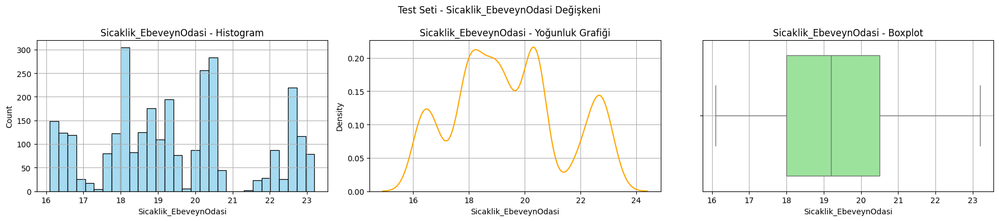


 Test - Nem_EbeveynOdasi için istatistikler
Ortalama: 40.64
Medyan: 40.0
Minimum: 29.1666666666667
Maksimum: 51.59
Standart Sapma: 4.12
Varyans: 16.94


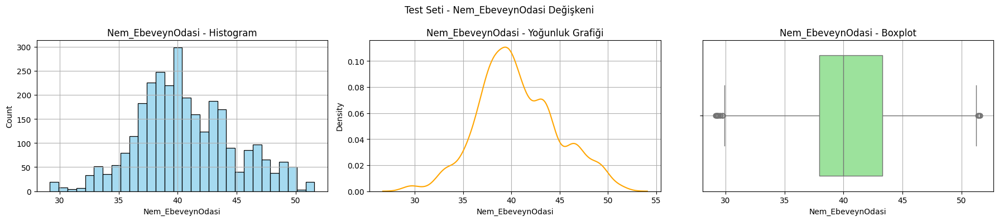


 Test - Sicaklik_DisHava için istatistikler
Ortalama: 7.42
Medyan: 7.15
Minimum: -1.4
Maksimum: 23.0
Standart Sapma: 4.53
Varyans: 20.49


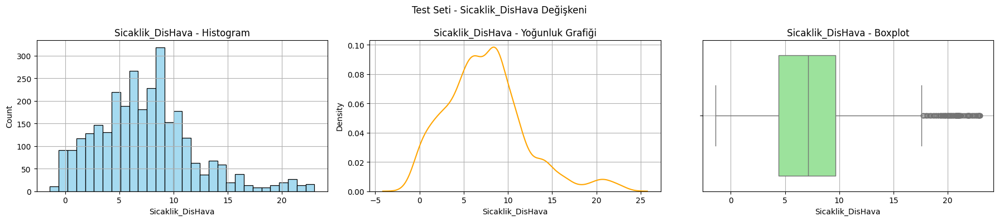


 Test - Basinc için istatistikler
Ortalama: 754.88
Medyan: 755.23
Minimum: 739.1
Maksimum: 765.7
Standart Sapma: 4.7
Varyans: 22.09


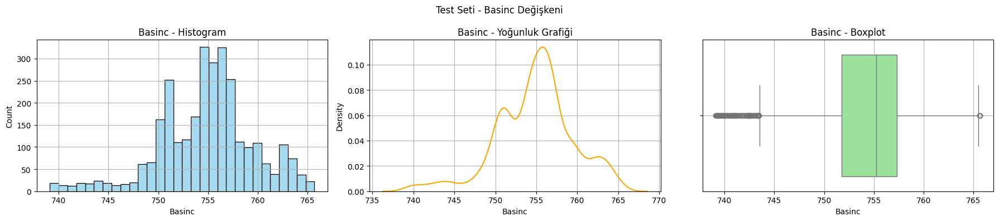


 Test - Nem_DisHava için istatistikler
Ortalama: 77.74
Medyan: 80.17
Minimum: 41.0
Maksimum: 100.0
Standart Sapma: 13.21
Varyans: 174.52


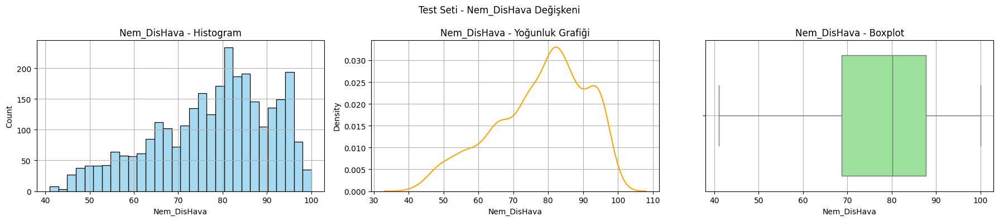


 Test - Ruzgar_Hizi için istatistikler
Ortalama: 4.66
Medyan: 4.17
Minimum: 1.0
Maksimum: 13.0
Standart Sapma: 2.8
Varyans: 7.82


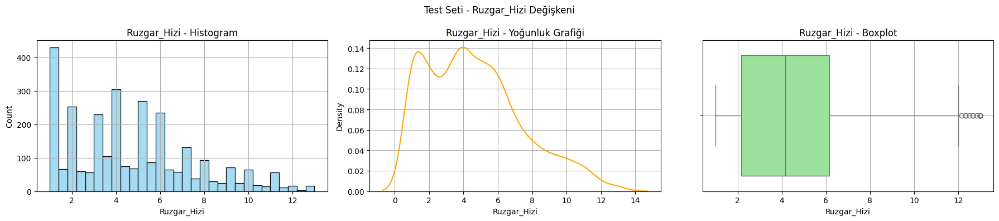


 Test - Gorus_Mesafesi için istatistikler
Ortalama: 37.28
Medyan: 40.0
Minimum: 1.0
Maksimum: 65.0
Standart Sapma: 9.88
Varyans: 97.64


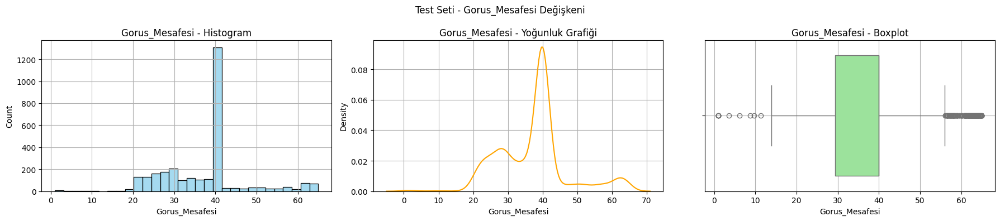


 Test - CiyNoktasi_Sicakligi için istatistikler
Ortalama: 3.5
Medyan: 3.97
Minimum: -5.1
Maksimum: 13.7
Standart Sapma: 4.13
Varyans: 17.09


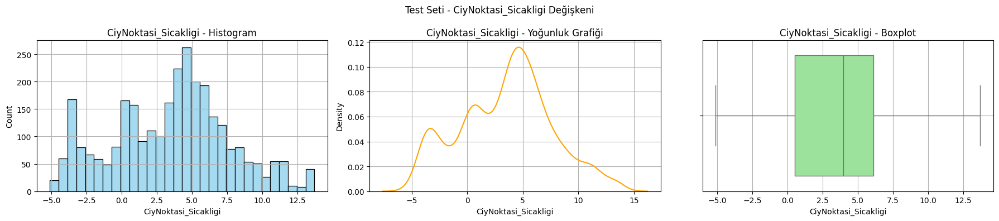


 Test - Rastgele_Degisken_1 için istatistikler
Ortalama: 25.15
Medyan: 24.89
Minimum: 0.0285261077806353
Maksimum: 49.993172963149846
Standart Sapma: 14.53
Varyans: 211.02


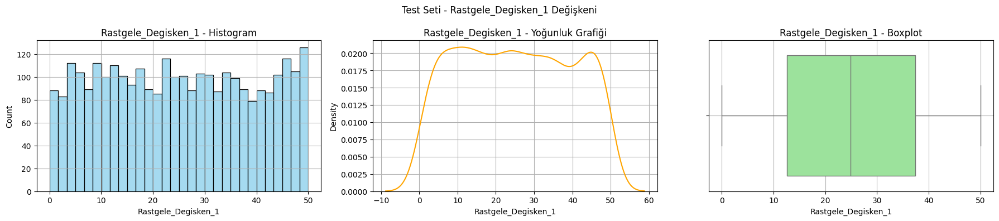


 Test - Rastgele_Degisken_2 için istatistikler
Ortalama: 25.15
Medyan: 24.89
Minimum: 0.0285261077806353
Maksimum: 49.993172963149846
Standart Sapma: 14.53
Varyans: 211.02


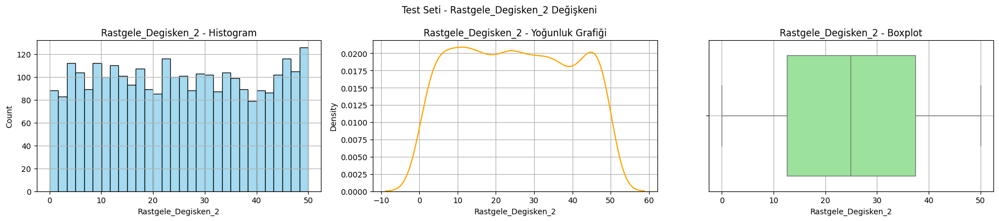

In [5]:
def tek_deg_analiz(df, set_adi):
    sayisal_sutunlar = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

    for sutun in sayisal_sutunlar:
        print(f"\n {set_adi} - {sutun} için istatistikler")
        print("Ortalama:", round(df[sutun].mean(), 2))
        print("Medyan:", round(df[sutun].median(), 2))
        print("Minimum:", df[sutun].min())
        print("Maksimum:", df[sutun].max())
        print("Standart Sapma:", round(df[sutun].std(), 2))
        print("Varyans:", round(df[sutun].var(), 2))

        fig, axs = plt.subplots(1, 3, figsize=(18,4))

        # Histogram
        sns.histplot(df[sutun], kde=False, ax=axs[0], bins=30, color='skyblue')
        axs[0].set_title(f"{sutun} - Histogram")
        axs[0].grid(True)

        # KDE (Density Plot)
        sns.kdeplot(df[sutun], ax=axs[1], color='orange')
        axs[1].set_title(f"{sutun} - Yoğunluk Grafiği")
        axs[1].grid(True)

        # Boxplot
        sns.boxplot(x=df[sutun], ax=axs[2], color='lightgreen')
        axs[2].set_title(f"{sutun} - Boxplot")
        axs[2].grid(True)

        plt.suptitle(f"{set_adi} Seti - {sutun} Değişkeni")
        plt.tight_layout()
        plt.show()
for veri_seti, adi in [(df_train, "Train"), (df_val, "Validation"), (df_test, "Test")]:
    tek_deg_analiz(veri_seti, adi)


In [6]:
def kategorik_frekans(df, kol_adi, set_adi):
    plt.figure(figsize=(6,4))
    sns.countplot(x=df[kol_adi], order=df[kol_adi].value_counts().index)
    plt.title(f"{set_adi} - {kol_adi} Frekans Dağılımı")
    plt.ylabel("Adet")
    plt.xlabel(kol_adi)
    plt.grid(True)
    plt.show()




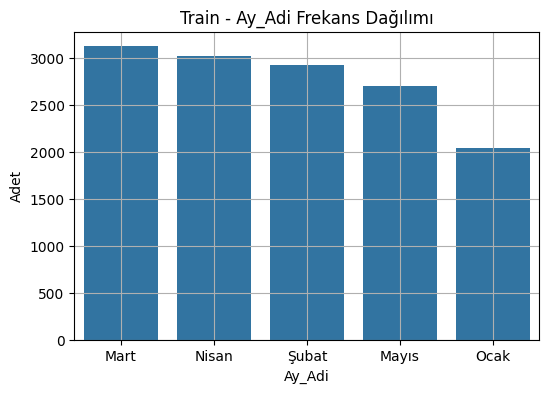

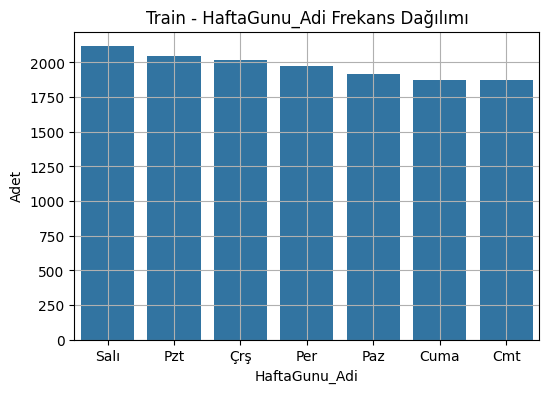

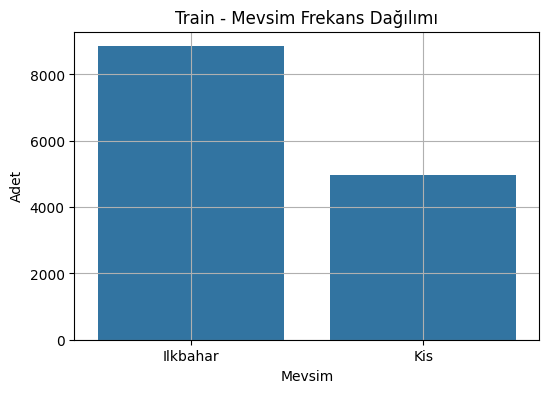

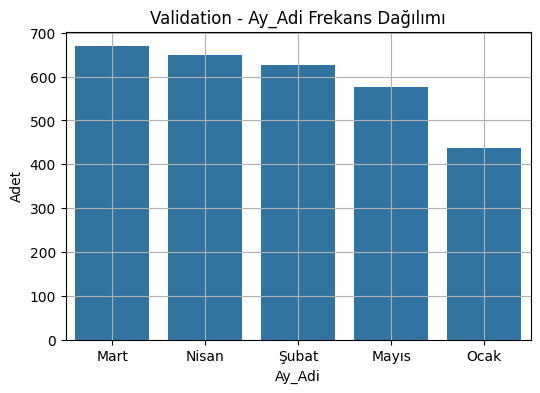

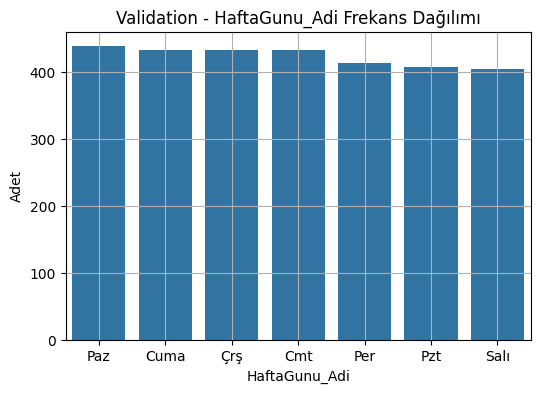

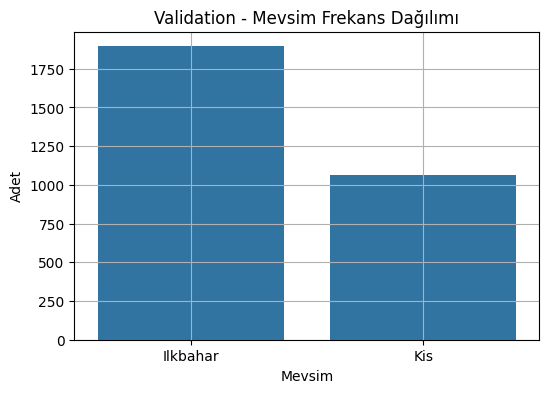

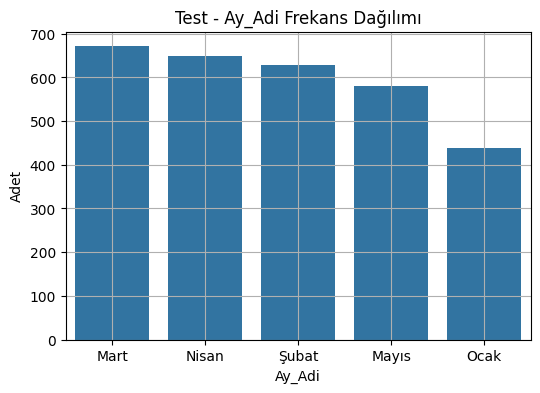

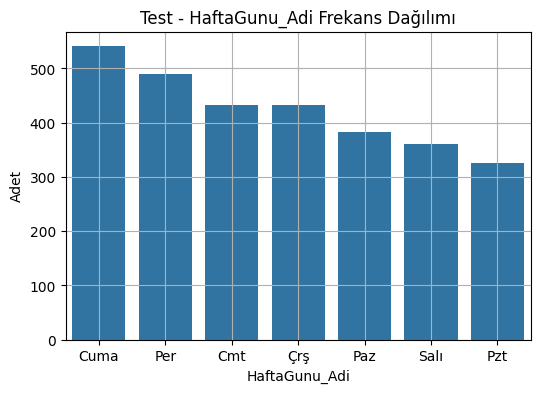

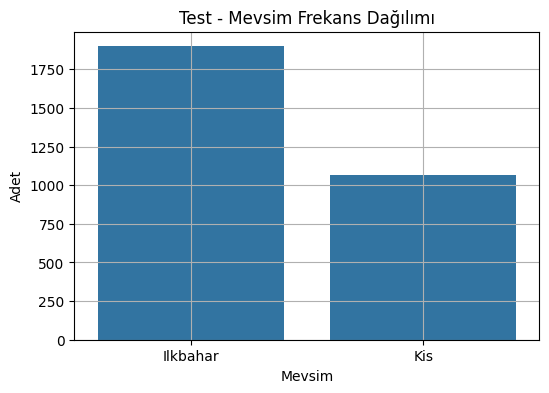

In [7]:

kategorik_frekans(df_train, 'Ay_Adi', 'Train')
kategorik_frekans(df_train, 'HaftaGunu_Adi', 'Train')
kategorik_frekans(df_train, 'Mevsim', 'Train')

kategorik_frekans(df_val, 'Ay_Adi', 'Validation')
kategorik_frekans(df_val, 'HaftaGunu_Adi', 'Validation')
kategorik_frekans(df_val, 'Mevsim', 'Validation')

kategorik_frekans(df_test, 'Ay_Adi', 'Test')
kategorik_frekans(df_test, 'HaftaGunu_Adi', 'Test')
kategorik_frekans(df_test, 'Mevsim', 'Test')


<ipython-input-8-508ab9e24132>:27: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


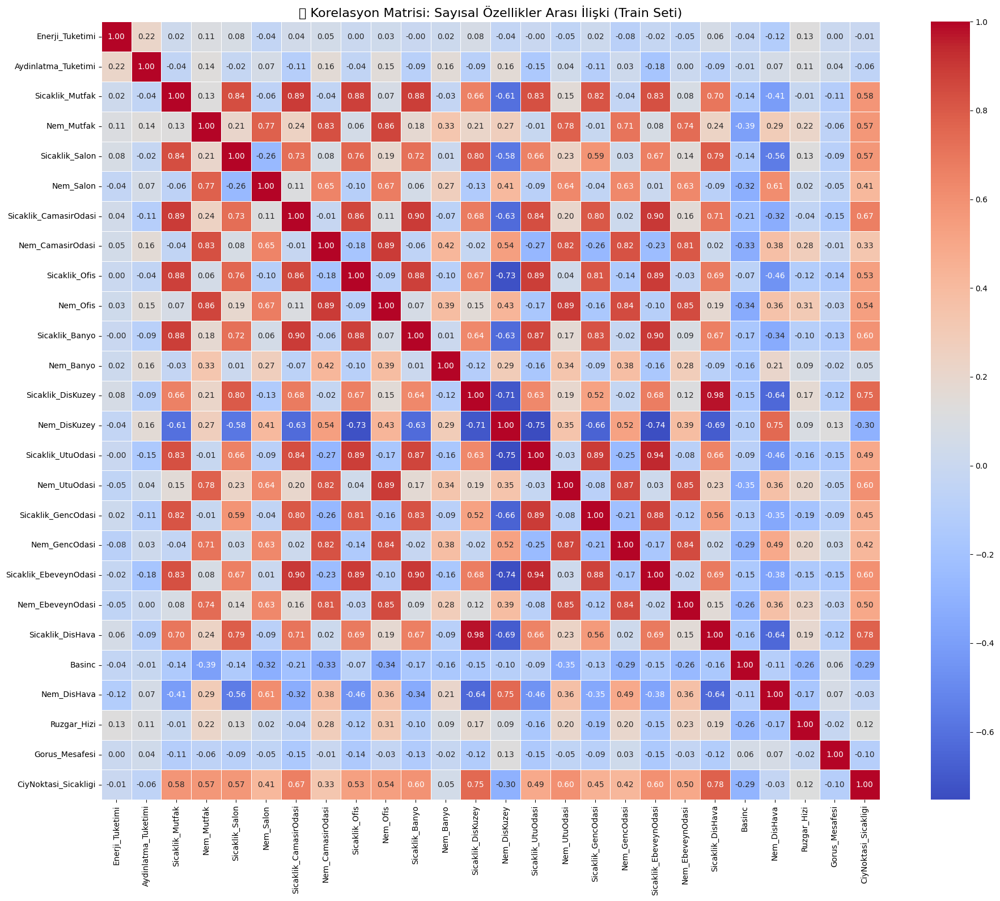

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Korelasyon matrisi sayisal degiskenler ile
sayisal_kolonlar = [
    'Enerji_Tuketimi', 'Aydinlatma_Tuketimi',
    'Sicaklik_Mutfak', 'Nem_Mutfak',
    'Sicaklik_Salon', 'Nem_Salon',
    'Sicaklik_CamasirOdasi', 'Nem_CamasirOdasi',
    'Sicaklik_Ofis', 'Nem_Ofis',
    'Sicaklik_Banyo', 'Nem_Banyo',
    'Sicaklik_DisKuzey', 'Nem_DisKuzey',
    'Sicaklik_UtuOdasi', 'Nem_UtuOdasi',
    'Sicaklik_GencOdasi', 'Nem_GencOdasi',
    'Sicaklik_EbeveynOdasi', 'Nem_EbeveynOdasi',
    'Sicaklik_DisHava', 'Basinc', 'Nem_DisHava',
    'Ruzgar_Hizi', 'Gorus_Mesafesi', 'CiyNoktasi_Sicakligi'
]

# sadece sayisal degiskenleri iceren dataframe
korelasyon_df = df_train[sayisal_kolonlar].corr()

# isi haritasi
plt.figure(figsize=(20, 16))
sns.heatmap(korelasyon_df, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, square=True)
plt.title("📈 Korelasyon Matrisi: Sayısal Özellikler Arası İlişki (Train Seti)", fontsize=16)
plt.tight_layout()
plt.show()


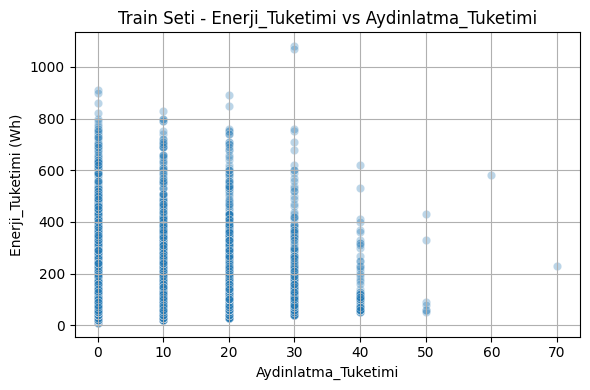

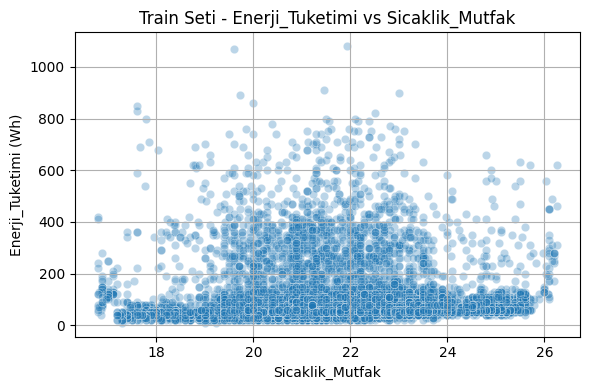

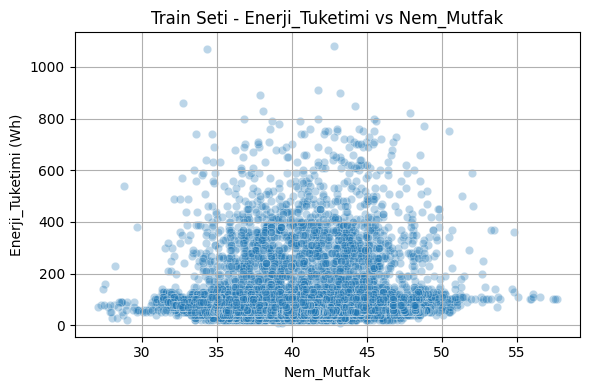

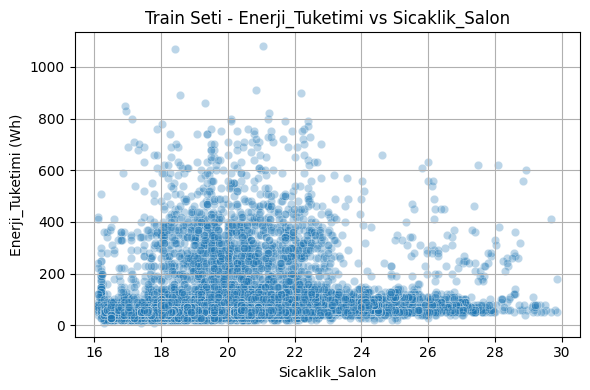

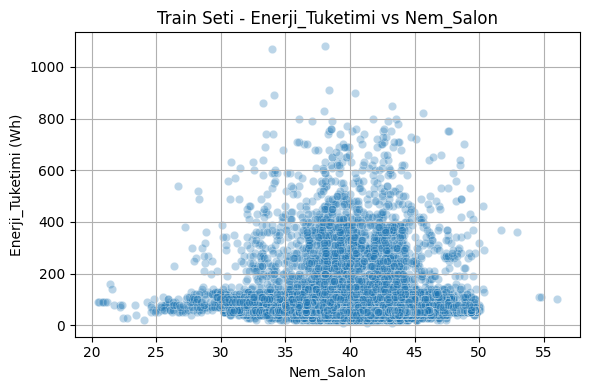

...

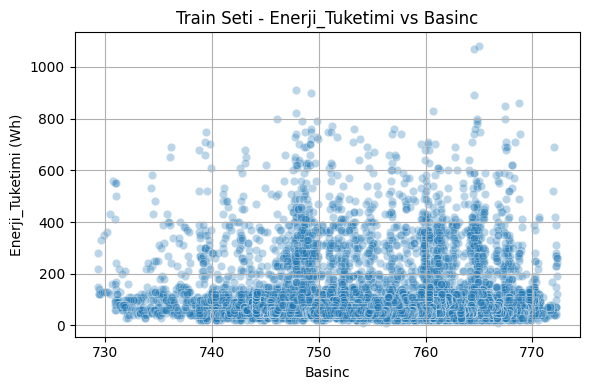

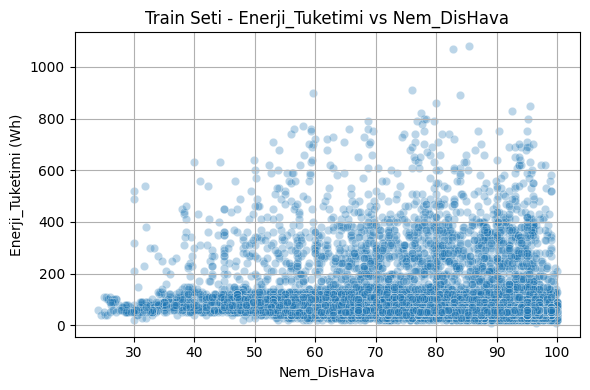

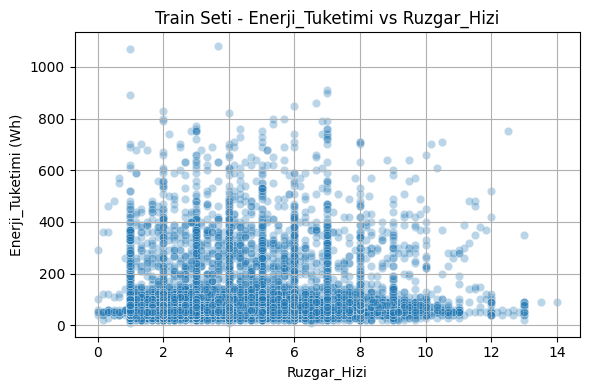

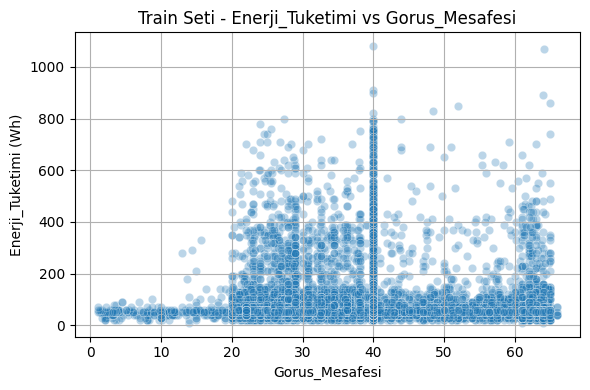

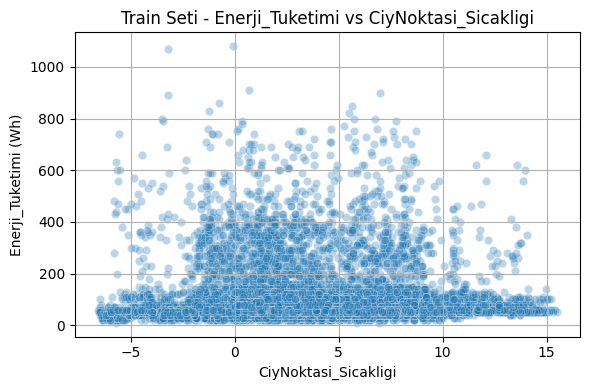

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# hedef degisken ile sayisallar arasindaki iliskiler

def scatter_analiz(df, x_degisken, set_adi='Train'):
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=df[x_degisken], y=df['Enerji_Tuketimi'], alpha=0.3)
    plt.title(f"{set_adi} Seti - Enerji_Tuketimi vs {x_degisken}")
    plt.xlabel(x_degisken)
    plt.ylabel("Enerji_Tuketimi (Wh)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Türkçeleştirilmiş önemli sayısal öznitelikler (Enerji_Tuketimi hariç)
sayisal_degiskenler = [
    'Aydinlatma_Tuketimi',
    'Sicaklik_Mutfak', 'Nem_Mutfak',
    'Sicaklik_Salon', 'Nem_Salon',
    'Sicaklik_CamasirOdasi', 'Nem_CamasirOdasi',
    'Sicaklik_Ofis', 'Nem_Ofis',
    'Sicaklik_Banyo', 'Nem_Banyo',
    'Sicaklik_DisKuzey', 'Nem_DisKuzey',
    'Sicaklik_UtuOdasi', 'Nem_UtuOdasi',
    'Sicaklik_GencOdasi', 'Nem_GencOdasi',
    'Sicaklik_EbeveynOdasi', 'Nem_EbeveynOdasi',
    'Sicaklik_DisHava', 'Basinc', 'Nem_DisHava',
    'Ruzgar_Hizi', 'Gorus_Mesafesi', 'CiyNoktasi_Sicakligi'
]

# grafiklerin cizimi
for deg in sayisal_degiskenler:
    scatter_analiz(df_train, deg, 'Train')


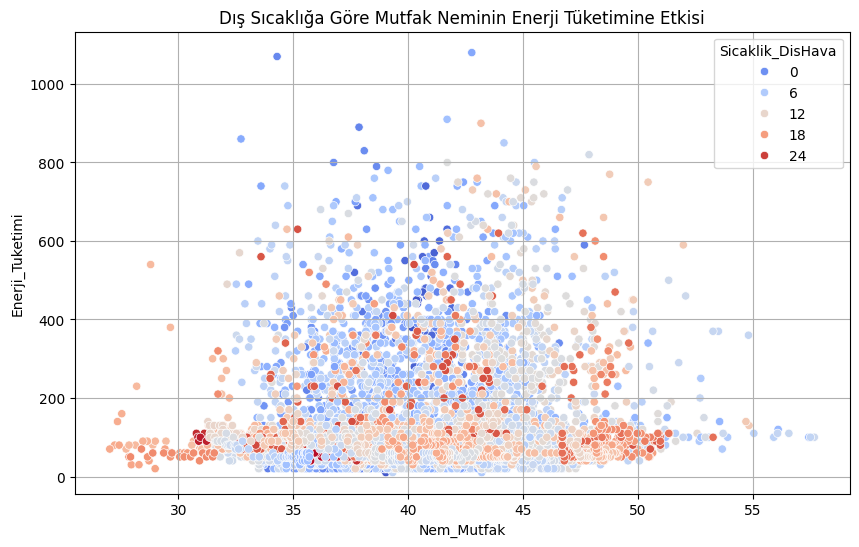

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_train, x='Nem_Mutfak', y='Enerji_Tuketimi', hue='Sicaklik_DisHava', palette='coolwarm')
plt.title('Dış Sıcaklığa Göre Mutfak Neminin Enerji Tüketimine Etkisi')
plt.grid(True)
plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


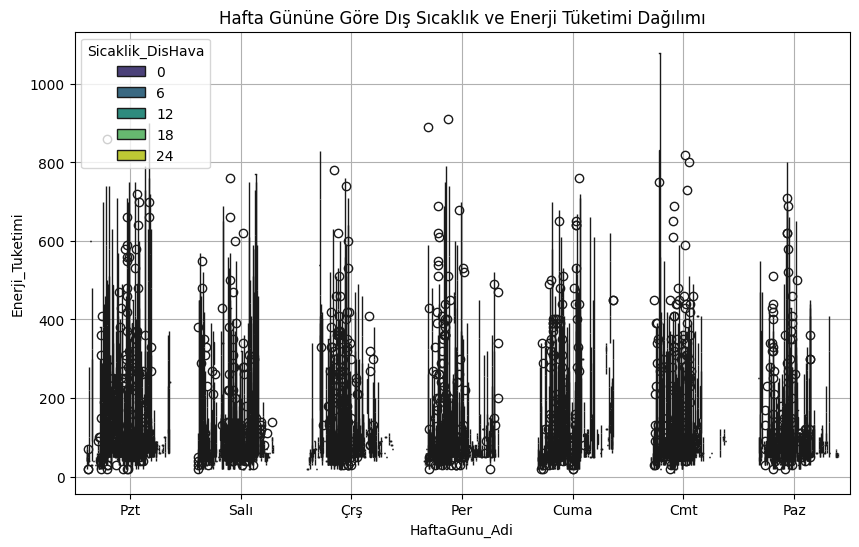

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_train, x='HaftaGunu_Adi', y='Enerji_Tuketimi', hue='Sicaklik_DisHava', palette='viridis')
plt.title('Hafta Gününe Göre Dış Sıcaklık ve Enerji Tüketimi Dağılımı')
plt.grid(True)
plt.show()


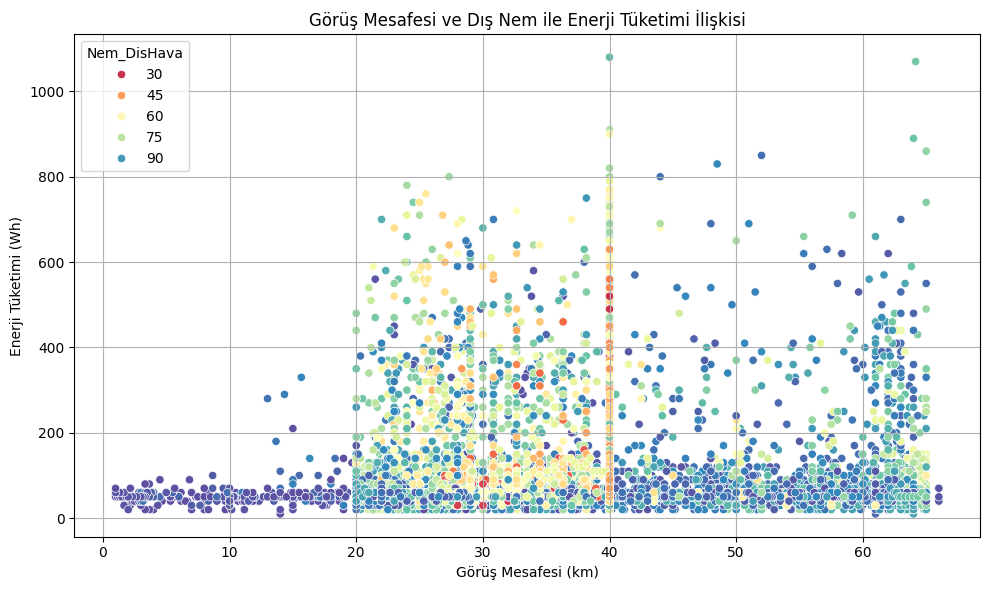

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_train,
    x='Gorus_Mesafesi',
    y='Enerji_Tuketimi',
    hue='Nem_DisHava',
    palette='Spectral'
)
plt.title('Görüş Mesafesi ve Dış Nem ile Enerji Tüketimi İlişkisi')
plt.xlabel('Görüş Mesafesi (km)')
plt.ylabel('Enerji Tüketimi (Wh)')
plt.grid(True)
plt.tight_layout()
plt.show()


In [13]:
df_train['Saat'] = df_train.index.hour


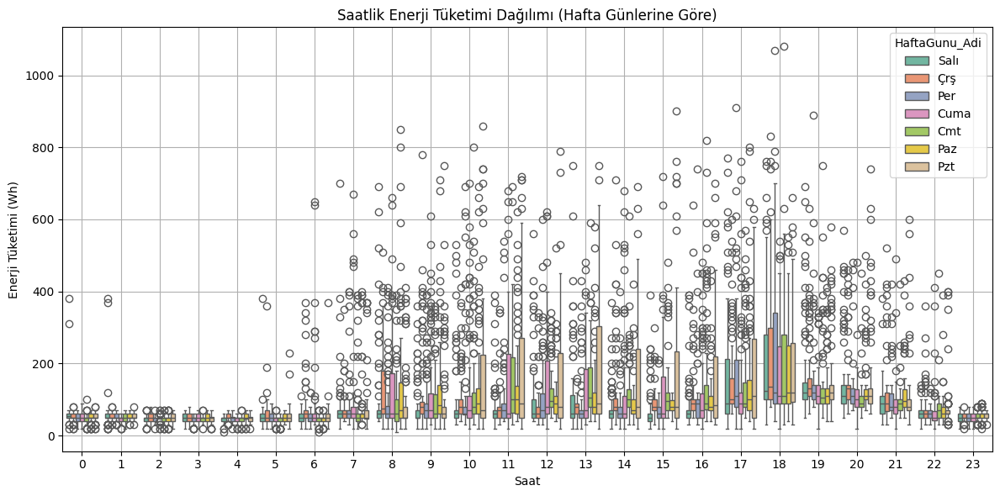

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df_train,
    x='Saat',
    y='Enerji_Tuketimi',
    hue='HaftaGunu_Adi',
    palette='Set2'
)
plt.title('Saatlik Enerji Tüketimi Dağılımı (Hafta Günlerine Göre)')
plt.xlabel('Saat')
plt.ylabel('Enerji Tüketimi (Wh)')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

display(df.head())

,Enerji_Tuketimi,Aydinlatma_Tuketimi,Sicaklik_Mutfak,Nem_Mutfak,Sicaklik_Salon,Nem_Salon,Sicaklik_CamasirOdasi,Nem_CamasirOdasi,Sicaklik_Ofis,Nem_Ofis,...,Gorus_Mesafesi,CiyNoktasi_Sicakligi,Rastgele_Degisken_1,Rastgele_Degisken_2,Yil,Ay,Mevsim,HaftaGunu,HaftaGunu_Adi,Ay_Adi
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,63.000000,5.3,13.275433,13.275433,2016,1,Kis,0,Pzt,Ocak
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,59.166667,5.2,18.606195,18.606195,2016,1,Kis,0,Pzt,Ocak
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,55.333333,5.1,28.642668,28.642668,2016,1,Kis,0,Pzt,Ocak
2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,51.500000,5.0,45.410389,45.410389,2016,1,Kis,0,Pzt,Ocak
2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,47.666667,4.9,10.084097,10.084097,2016,1,Kis,0,Pzt,Ocak
